# ___Krivoshey Nikita___
- Period : Jan - Jun 2023
- Transaction group - Sales
- Data downloaded from the link: https://www.dubaipulse.gov.ae/data/dld-transactions/dld_transactions-open
- The data can be downloaded from my google drive: https://drive.google.com/file/d/1HtPmVOFeYprczsDIi0eOyA8qBqLW_RUE/view?usp=share_link

### __Import libraries__

In [ ]:
# Библиотеки необходимые для работы с геоданными и отрисовкой на карте
# !pip install folium
# !pip install geopy

# Библиотеки необходимые для построение модели машинного обучения
# !pip install sklearn
# !pip install catboost xgboost

In [ ]:
import numpy as np
import pandas as pd
import math

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from IPython.display import display

import folium
import json
import calendar
from geopy.geocoders import Nominatim
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
import plotly.graph_objects as go


import catboost
from catboost import Pool
import xgboost
from catboost import CatBoostRegressor
from xgboost import XGBRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_log_error

sns.set_style("whitegrid")

pd.set_option('display.max_columns', None)

# pd.options.display.float_format = '{:.4f}'.format # Для отображения больших float чисел в нормально формате без 'e+'

## 1. Data Retrieval and Preprocessing

In [ ]:
# Загрузка данных csv файла и вывод первых 5 строк,размерность
df = pd.read_csv('Transactions.csv')
display(df.head())

print(f'Размерность датасета:{df.shape}')

,transaction_id,procedure_id,trans_group_id,trans_group_ar,trans_group_en,procedure_name_ar,procedure_name_en,instance_date,property_type_id,property_type_ar,property_type_en,property_sub_type_id,property_sub_type_ar,property_sub_type_en,property_usage_ar,property_usage_en,reg_type_id,reg_type_ar,reg_type_en,area_id,area_name_ar,area_name_en,building_name_ar,building_name_en,project_number,project_name_ar,project_name_en,master_project_en,master_project_ar,nearest_landmark_ar,nearest_landmark_en,nearest_metro_ar,nearest_metro_en,nearest_mall_ar,nearest_mall_en,rooms_ar,rooms_en,has_parking,procedure_area,actual_worth,meter_sale_price,rent_value,meter_rent_price,no_of_parties_role_1,no_of_parties_role_2,no_of_parties_role_3
0,1-11-2004-2099,11,1,مبايعات,Sales,بيع,Sell,04-10-2004,4,فيلا,Villa,NaN,NaN,NaN,تجاري,Commercial,1,العقارات القائمة,Existing Properties,249,المطينه,Al Muteena,NaN,NaN,NaN,NaN,NaN,NaN,NaN,مطار دبي الدولي,Dubai International Airport,محطة مترو صلاح الدين,Salah Al Din Metro Station,مول دبي,Dubai Mall,NaN,NaN,0,860.28,4500000.0,5230.86,NaN,NaN,3.0,1.0,0.0
1,1-11-2011-6898,11,1,مبايعات,Sales,بيع,Sell,21-04-2011,3,وحدة,Unit,60.0,شقه سكنيه,Flat,سكني,Residential,1,العقارات القائمة,Existing Properties,390,برج خليفة,Burj Khalifa,برج خليفة,Burj Khalifa,1462.0,أبراج برج خليفة,BURJ KHALIFA TOWERS,Burj Khalifa,برج خليفة,برج خليفة,Burj Khalifa,محطة مترو بوج خليفة دبي مول,Buj Khalifa Dubai Mall Metro Station,مول دبي,Dubai Mall,غرفة,1 B/R,1,89.93,2008888.0,22338.35,NaN,NaN,1.0,1.0,0.0
2,1-11-2008-203212,11,1,مبايعات,Sales,بيع,Sell,11-06-2008,3,وحدة,Unit,60.0,شقه سكنيه,Flat,سكني,Residential,1,العقارات القائمة,Existing Properties,343,ورسان الاولى,Al Warsan First,ان - 09,N-09,NaN,NaN,NaN,International City Phase 1,المدينة العالمية - المرحلة الاولى,NaN,NaN,محطة مترو الراشدية,Rashidiya Metro Station,سيتي سنتر مردف,City Centre Mirdif,غرفة,1 B/R,0,67.00,330000.0,4925.37,NaN,NaN,1.0,1.0,0.0
3,1-11-2010-15769,11,1,مبايعات,Sales,بيع,Sell,25-10-2010,3,وحدة,Unit,60.0,شقه سكنيه,Flat,سكني,Residential,1,العقارات القائمة,Existing Properties,350,الثنيه الخامسة,Al Thanyah Fifth,جرين ليكس اس 1,GREEN LAKES S1,NaN,NaN,NaN,Jumeirah Lakes Towers,ابراج بحيرات الجميرا,برج العرب,Burj Al Arab,عقارات داماك,Damac Properties,مارينا مول,Marina Mall,غرفة,1 B/R,1,100.80,928756.0,9213.85,NaN,NaN,1.0,1.0,0.0
4,1-110-2010-557,110,1,مبايعات,Sales,تسجيل إيجارة تنتهى بالتملك,Lease to Own Registration,24-03-2010,3,وحدة,Unit,60.0,شقه سكنيه,Flat,سكني,Residential,1,العقارات القائمة,Existing Properties,343,ورسان الاولى,Al Warsan First,اكس - 23,X-23,NaN,NaN,NaN,International City Phase 1,المدينة العالمية - المرحلة الاولى,مطار دبي الدولي,Dubai International Airport,محطة مترو الراشدية,Rashidiya Metro Station,سيتي سنتر مردف,City Centre Mirdif,استوديو,Studio,0,43.00,290000.0,6744.19,NaN,NaN,4.0,2.0,2.0


Размерность датасета:(1151769, 46)


In [ ]:
# Изначально выведем количество и тип данных, с которыми мы будем работать
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1151769 entries, 0 to 1151768
Data columns (total 46 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   transaction_id        1151769 non-null  object 
 1   procedure_id          1151769 non-null  int64  
 2   trans_group_id        1151769 non-null  int64  
 3   trans_group_ar        1151769 non-null  object 
 4   trans_group_en        1151769 non-null  object 
 5   procedure_name_ar     1151769 non-null  object 
 6   procedure_name_en     1151769 non-null  object 
 7   instance_date         1151769 non-null  object 
 8   property_type_id      1151769 non-null  int64  
 9   property_type_ar      1151769 non-null  object 
 10  property_type_en      1151769 non-null  object 
 11  property_sub_type_id  888704 non-null   float64
 12  property_sub_type_ar  888704 non-null   object 
 13  property_sub_type_en  888704 non-null   object 
 14  property_usage_ar     1151769 non-

In [ ]:
# Необходимо проверить наши данные на дубликаты
print(f'Кол-во дубликатов в данных: {len(df[df.duplicated()])}')

# Видим, что все строки у нас уникальные, поэтому переходим к дальнейшему анализу

Кол-во дубликатов в данных: 0


In [ ]:
# Теперь выбор необходимых промежутков(Jan - Jun 2023) и типов группы процедуры (Sales)
# Видим, что тип instance_date = 'object', нужно будет переделать в формат datetime

# Используем errors='coerce', чтобы заменять невалидные даты сразу на NaT,чтобы потом удалить их
df['instance_date'] = pd.to_datetime(df['instance_date'], format='%d-%m-%Y',errors='coerce')

# Переделываем в более привычный формат даты '%Y-%m-%d'
df['instance_date'] = df['instance_date'].dt.strftime('%Y-%m-%d')

# Всего 4 невалидных даты, поэтому удаляем, так как не знаем точную дату, когда была сделка
print(f'Кол-во невалидные даты для анализа: {len(df[df["instance_date"].isna()])}')
df = df.dropna(subset=['instance_date'])

# Устанавливаем ограничения
df = df[(df['instance_date'] >= '2023-01-01') & (df['instance_date'] <= '2023-06-30') & (df['trans_group_en'] == 'Sales')].reset_index(drop=True)
df['instance_date'] = pd.to_datetime(df['instance_date'], format='%Y-%m-%d')
print(f'Размерность данных после фильтрации по дате и группе операций: {len(df)}')
# Поменял дату с str на datetime, остальные колонки по типу float,int или str, что соответствует наглядному анализу

Кол-во невалидные даты для анализа: 4
Размерность данных после фильтрации по дате и группе операций: 61286


> __Небольшое замечание насчет колонок в данных с арабским языком__
* Видим, что есть колонки, которые пишутся на арабском языке, однако рядом с ними стоят уже одноименные на английском языке

__!pip install googletrans==4.0.0-rc1__ ---> для загрузки библиотеки

* Если бы не было колонок с переводом с арабского языка, то можно было бы использовать следующий код
* Это библиотека - переводчик, который делает перевод с арабского на английский
* Поскольку в датасете присутствуют колонки на английском с аналогичными данными, то в этом случае использовать его нет смысла
* Однако очень полезная библиотека для работы с текстовыми данными

```
from googletrans import Translator

def translate_arabic_to_english(arabic_text):
    translator = Translator()
    translation = translator.translate(arabic_text, src='ar', dest='en')
    return translation.text

arabic_text = "مرحبا بك في عالم البرمجة" - Текст для примера
english_text = translate_arabic_to_english(arabic_text)

print(english_text)

Таким образом можно применить функцию к нужному столбцу
df['col_en'] =  df['col_ar'].apply(translate_arabic_to_english)

```

In [ ]:
# Первое, что сделаем, то удалим колонки с арабским языком, так как есть с английским
# Мы можем переписать их в ручную, но а, если колонок 100 или более, то уже будет сложно, поэтому сразу напишем функцию!

# Список всех колонок
columns = df.columns

# Удалим колонки, оканчивающиеся на "_ar"
columns_to_remove = [col for col in columns if col.endswith('_ar')]
df = df.drop(columns=columns_to_remove)

# Видим, что остались только англоязычные колонки


#Также видим, что у нас есть transaction_id,которая является уникальным айди к каждой сделке
# Для дальнейшего анализа данная величина будет неинформативна, удалим
df.drop(columns= ['transaction_id'], inplace = True)
df.head()

,procedure_id,trans_group_id,trans_group_en,procedure_name_en,instance_date,property_type_id,property_type_en,property_sub_type_id,property_sub_type_en,property_usage_en,reg_type_id,reg_type_en,area_id,area_name_en,building_name_en,project_number,project_name_en,master_project_en,nearest_landmark_en,nearest_metro_en,nearest_mall_en,rooms_en,has_parking,procedure_area,actual_worth,meter_sale_price,rent_value,meter_rent_price,no_of_parties_role_1,no_of_parties_role_2,no_of_parties_role_3
0,102,1,Sales,Sell - Pre registration,2023-01-30,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,350,Al Thanyah Fifth,Seven City JLT,2065.0,SEVEN CITY JLT,Jumeirah Islands,Burj Al Arab,Damac Properties,Marina Mall,Studio,1,35.67,557417.0,15627.05,NaN,NaN,1.0,1.0,0.0
1,102,1,Sales,Sell - Pre registration,2023-03-27,4,Villa,4.0,Villa,Residential,0,Off-Plan Properties,485,Me'Aisem First,NaN,2506.0,Jouri Hills,Jumeirah Golf Estates,NaN,NaN,NaN,4 B/R,0,349.71,5266800.0,15060.48,NaN,NaN,1.0,1.0,0.0
2,11,1,Sales,Sell,2023-05-16,3,Unit,42.0,Office,Commercial,1,Existing Properties,526,Business Bay,Churchill Tower 1-Commercial,1178.0,CHURCHILL TOWER,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Office,1,57.60,735000.0,12760.42,NaN,NaN,1.0,1.0,0.0
3,102,1,Sales,Sell - Pre registration,2023-04-10,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,452,Al Hebiah Second,Samana Mykonos,2561.0,Samana Mykonos,Dubai Studio City,Motor City,NaN,NaN,Studio,1,38.58,717627.0,18601.03,NaN,NaN,1.0,1.0,0.0
4,41,1,Sales,Delayed Sell,2023-01-13,1,Land,NaN,NaN,Residential,1,Existing Properties,451,Al Hebiah Fifth,NaN,2488.0,DAMAC LAGOONS - MONTE CARLO,NaN,NaN,NaN,NaN,NaN,0,144.00,1959000.0,13604.17,NaN,NaN,1.0,1.0,0.0


In [ ]:
# Далее начнем с пропущенных значений, посмотрим на распределения NaN значений в колонках

threshold = 35
nan = pd.DataFrame(df.isna().sum(), columns = ['NaN_sum'])
nan['Features'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/len(df))*100  # Подсчитываем процентное значение пропущенных значений в колонке
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum']) #Трешхолд для удаления столбца поставим 20%, так как данных немного
nan['Usability'] = np.where(nan['Perc(%)'] > threshold, 'Отбрасываем', 'Оставляем') #микро-вывод на основе nan значений признака
display(nan)

,NaN_sum,Features,Perc(%),Usability
project_number,7354,project_number,11.999478,Оставляем
project_name_en,7354,project_name_en,11.999478,Оставляем
property_sub_type_id,7550,property_sub_type_id,12.319290,Оставляем
property_sub_type_en,7550,property_sub_type_en,12.319290,Оставляем
rooms_en,8126,rooms_en,13.259146,Оставляем
master_project_en,12730,master_project_en,20.771465,Оставляем
building_name_en,13285,building_name_en,21.677055,Оставляем
nearest_landmark_en,14835,nearest_landmark_en,24.206181,Оставляем
nearest_metro_en,20799,nearest_metro_en,33.937604,Оставляем
nearest_mall_en,20946,nearest_mall_en,34.177463,Оставляем


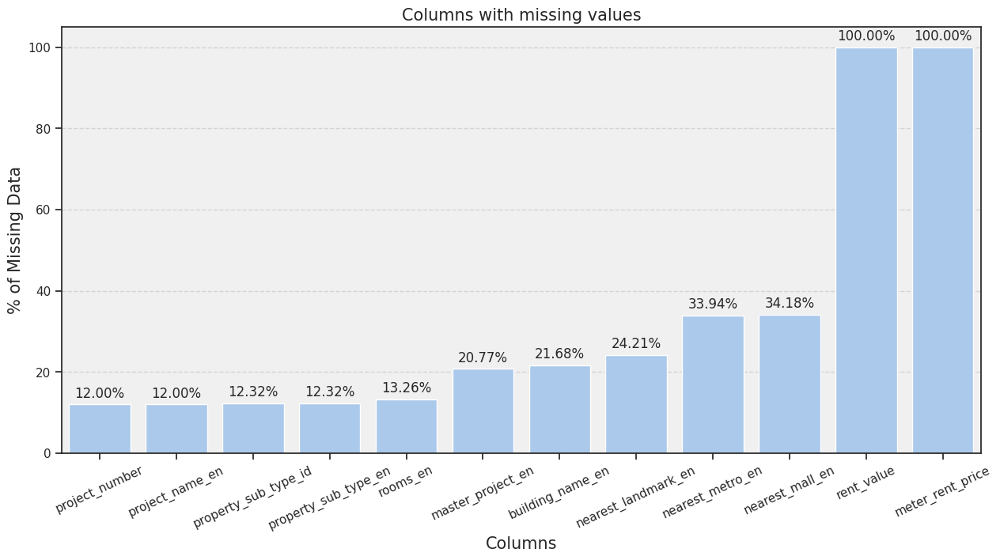

In [ ]:
# Отрисовка пропущенных значений по колонкам

# Устанавливаем стиль и палитру
sns.set(style="ticks", palette="pastel")

# Создаем график
plt.figure(figsize=(15, 7))

# Добавляем цвет фона и сетку
plt.gca().set_facecolor('#f0f0f0')  # Замените на желаемый цвет фона (например, светло-серый)
plt.grid(axis='y', linestyle='--', alpha=0.8)

# Строим график
ax = sns.barplot(x=nan['Features'], y=nan['Perc(%)'])

# Добавляем проценты внутрь столбцов
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=25) # Поворот значений по оси X на 25 градусов
plt.title('Columns with missing values',fontsize=15)
plt.xlabel('Columns',fontsize=15)
plt.ylabel('% of Missing Data',fontsize=15)
plt.show()

> Первое, что видно это то, что колонки rent_value & meter_rent_price имеют 100% пропущенных значений. Они однозначно будут удаляться из датасета. Я сделал трешхолд 35%, поскольку данных около 60к и хочется оставить больше данных для анализа. Еще интересным является то, что колонки,которые имеют 20%-35% являются строковые. Строковые колонки сложнее заполнять какими-то значениями, чтобы избежать NaN значений в данных, поскольку методы интерполяции, заполнения средним, медианой к ним применить нельзя. Поэтому достаточно сложно будет с этими столбцами делать манипуляции.Для дальнейшей статистики, чтобы не было сильного смещения результатов я не буду использовать манипуляции с заполнением данных в колонках,так как это будет искажать вычисления. Для построения baseline модели машинного обучения я буду использовать только чистые данные для корректного обучения модели без подгонки. Еще одним замечанием скажу, что и заполнение колонок выше (имующие одинаковые % значения) методом интерполяции будет не весьма корректно, так как там идут "категориальные", а не непрерывные данные, поэтому апроксимирующая прямая в этом случае не даст идеально корректного попадания в эти категории данных. Следовательно, для наиболее правильного и полноценного анализа данных, необходимо удалить NaN значения и колонки, которые имеют все 100% пропущенных значений.

In [ ]:
# Cписок коnanлонок для удаления
columns_to_drop = nan[nan['Perc(%)'] > threshold]['Features'].tolist()

# Удаление колонок с процентом пропущенных значений выше порога
df = df.drop(columns=columns_to_drop)

list_feat_to_dropna = nan[nan.Usability == 'Оставляем'].Features.tolist()
df.dropna(subset = list_feat_to_dropna, inplace = True)
display(df)

,procedure_id,trans_group_id,trans_group_en,procedure_name_en,instance_date,property_type_id,property_type_en,property_sub_type_id,property_sub_type_en,property_usage_en,reg_type_id,reg_type_en,area_id,area_name_en,building_name_en,project_number,project_name_en,master_project_en,nearest_landmark_en,nearest_metro_en,nearest_mall_en,rooms_en,has_parking,procedure_area,actual_worth,meter_sale_price,no_of_parties_role_1,no_of_parties_role_2,no_of_parties_role_3
0,102,1,Sales,Sell - Pre registration,2023-01-30,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,350,Al Thanyah Fifth,Seven City JLT,2065.0,SEVEN CITY JLT,Jumeirah Islands,Burj Al Arab,Damac Properties,Marina Mall,Studio,1,35.67,557417.0,15627.05,1.0,1.0,0.0
2,11,1,Sales,Sell,2023-05-16,3,Unit,42.0,Office,Commercial,1,Existing Properties,526,Business Bay,Churchill Tower 1-Commercial,1178.0,CHURCHILL TOWER,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Office,1,57.60,735000.0,12760.42,1.0,1.0,0.0
8,102,1,Sales,Sell - Pre registration,2023-05-15,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,441,Al Barsha South Fourth,Westwood Grande by Imtiaz,2520.0,Westwood Grande by Imtiaz,Jumeirah Village Circle,Sports City Swimming Academy,Nakheel Metro Station,Marina Mall,1 B/R,1,76.58,819152.0,10696.68,1.0,1.0,0.0
9,102,1,Sales,Sell - Pre registration,2023-02-09,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,526,Business Bay,Peninsula Four,2461.0,Peninsula Four,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Studio,1,49.01,1399000.0,28545.19,1.0,1.0,0.0
10,41,1,Sales,Delayed Sell,2023-03-29,3,Unit,60.0,Flat,Residential,1,Existing Properties,447,Al Khairan First,Creek Gate Tower 2,1813.0,Creek Gate,The Lagoons,Dubai International Airport,Creek Metro Station,City Centre Mirdif,2 B/R,1,192.59,2750000.0,14279.04,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61272,102,1,Sales,Sell - Pre registration,2023-04-11,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,441,Al Barsha South Fourth,Binghatti Corner,2478.0,Binghatti Corner,Jumeirah Village Circle,Sports City Swimming Academy,Dubai Internet City,Marina Mall,1 B/R,1,59.75,650000.0,10878.66,1.0,1.0,0.0
61273,11,1,Sales,Sell,2023-05-05,3,Unit,60.0,Flat,Residential,1,Existing Properties,441,Al Barsha South Fourth,OXFORD RESIDENCE,1881.0,Oxford Residence,Jumeirah Village Circle,Sports City Swimming Academy,Dubai Internet City,Marina Mall,Studio,1,51.85,460000.0,8871.75,1.0,2.0,0.0
61275,41,1,Sales,Delayed Sell,2023-05-23,3,Unit,60.0,Flat,Residential,1,Existing Properties,445,Jabal Ali First,THE NOOK 1-1,2086.0,The Nook,Wasl Gate,Expo 2020 Site,ENERGY Metro Station,Ibn-e-Battuta Mall,2 B/R,1,70.38,863777.0,12273.05,1.0,1.0,0.0
61278,102,1,Sales,Sell - Pre registration,2023-04-27,3,Unit,60.0,Flat,Residential,0,Off-Plan Properties,441,Al Barsha South Fourth,Elitz By Danube - 1,2533.0,Elitz By Danube,Jumeirah Village Circle,Sports City Swimming Academy,Dubai Internet City,Mall of the Emirates,Studio,1,40.88,638000.0,15606.65,1.0,1.0,0.0


In [ ]:
# Убеждаемся, что все невалидные данные из нашего набора мы удалили
df.isna().sum()

procedure_id            0
trans_group_id          0
trans_group_en          0
procedure_name_en       0
instance_date           0
property_type_id        0
property_type_en        0
property_sub_type_id    0
property_sub_type_en    0
property_usage_en       0
reg_type_id             0
reg_type_en             0
area_id                 0
area_name_en            0
building_name_en        0
project_number          0
project_name_en         0
master_project_en       0
nearest_landmark_en     0
nearest_metro_en        0
nearest_mall_en         0
rooms_en                0
has_parking             0
procedure_area          0
actual_worth            0
meter_sale_price        0
no_of_parties_role_1    0
no_of_parties_role_2    0
no_of_parties_role_3    0
dtype: int64

In [ ]:
# Заметим еще, что property_type_en колонка будет иметь одно уникальное значение, то есть будет отображать только один => убираем
dict_uniq = {}
for col in df.columns:
    dict_uniq[col] = df[col].nunique()

pd.DataFrame.from_dict(dict_uniq,orient = 'index').rename(columns = {0:'Uniq_quant'}).sort_values(by = 'Uniq_quant',ascending= False)

,Uniq_quant
meter_sale_price,23885
actual_worth,11075
procedure_area,8053
building_name_en,1006
project_number,711
project_name_en,709
instance_date,126
master_project_en,41
area_id,31
area_name_en,31


> Поскольку категориальным колонкам идут в соотвествии числовые признаки, то оставим только колонки с текстовыми данными для дальнейших этапов. Так как числовые колонки в этом случае менее информативные. Выборка содержит только группы Sales, то эта колонка trans_group_en будет иметь одинаковые значение, значит ее  убираем тоже.

In [ ]:
select_cols_to_collect = ['procedure_name_en','instance_date', 'property_sub_type_en',
'property_usage_en','reg_type_en', 'area_name_en',  'building_name_en','project_number',  'project_name_en','master_project_en', 'nearest_landmark_en', 'nearest_metro_en', 'nearest_mall_en', 'rooms_en','has_parking', 'procedure_area', 'actual_worth', 'meter_sale_price',
'no_of_parties_role_1','no_of_parties_role_2', 'no_of_parties_role_3']

df = df[select_cols_to_collect]
df.head()

,procedure_name_en,instance_date,property_sub_type_en,property_usage_en,reg_type_en,area_name_en,building_name_en,project_number,project_name_en,master_project_en,nearest_landmark_en,nearest_metro_en,nearest_mall_en,rooms_en,has_parking,procedure_area,actual_worth,meter_sale_price,no_of_parties_role_1,no_of_parties_role_2,no_of_parties_role_3
0,Sell - Pre registration,2023-01-30,Flat,Residential,Off-Plan Properties,Al Thanyah Fifth,Seven City JLT,2065.0,SEVEN CITY JLT,Jumeirah Islands,Burj Al Arab,Damac Properties,Marina Mall,Studio,1,35.67,557417.0,15627.05,1.0,1.0,0.0
2,Sell,2023-05-16,Office,Commercial,Existing Properties,Business Bay,Churchill Tower 1-Commercial,1178.0,CHURCHILL TOWER,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Office,1,57.60,735000.0,12760.42,1.0,1.0,0.0
8,Sell - Pre registration,2023-05-15,Flat,Residential,Off-Plan Properties,Al Barsha South Fourth,Westwood Grande by Imtiaz,2520.0,Westwood Grande by Imtiaz,Jumeirah Village Circle,Sports City Swimming Academy,Nakheel Metro Station,Marina Mall,1 B/R,1,76.58,819152.0,10696.68,1.0,1.0,0.0
9,Sell - Pre registration,2023-02-09,Flat,Residential,Off-Plan Properties,Business Bay,Peninsula Four,2461.0,Peninsula Four,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Studio,1,49.01,1399000.0,28545.19,1.0,1.0,0.0
10,Delayed Sell,2023-03-29,Flat,Residential,Existing Properties,Al Khairan First,Creek Gate Tower 2,1813.0,Creek Gate,The Lagoons,Dubai International Airport,Creek Metro Station,City Centre Mirdif,2 B/R,1,192.59,2750000.0,14279.04,1.0,1.0,0.0


## 2. Data Overview

> Если посмотрим на статистические показатели числовых данных, то по таким величинам как mean,std и др. сильных отклонений в этих показателях нет. Есть статистически отличные от какого-то тренда величины в стоимостях, но это весьма логично, что на цену влияет район, площадь, инфраструктура и тд. Поэтому по данным, которые не являются признаковыми или категориальными можно сказать, что все нормально.

In [ ]:
# Рассмотрим статистические показатели наших данных, а также сделаем визуализацию для строковых данных
round(df.describe().T, 2)

,count,mean,std,min,25%,50%,75%,max
project_number,27578.0,1948.33,711.39,2.00,1660.00,2210.00,2478.0,2.661000e+03
has_parking,27578.0,0.99,0.09,0.00,1.00,1.00,1.0,1.000000e+00
procedure_area,27578.0,93.36,78.29,2.16,57.76,75.08,108.8,2.463200e+03
actual_worth,27578.0,1854191.90,3167522.36,3599.00,690000.00,1166666.00,2059000.0,1.050000e+08
meter_sale_price,27578.0,17701.76,9666.84,53.66,11377.34,15385.18,22204.9,5.309753e+05
no_of_parties_role_1,27578.0,1.07,0.41,1.00,1.00,1.00,1.0,2.000000e+01
no_of_parties_role_2,27578.0,1.15,0.41,0.00,1.00,1.00,1.0,8.000000e+00
no_of_parties_role_3,27578.0,0.01,0.12,0.00,0.00,0.00,0.0,4.000000e+00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27578 entries, 0 to 61283
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   procedure_name_en     27578 non-null  object        
 1   instance_date         27578 non-null  datetime64[ns]
 2   property_sub_type_en  27578 non-null  object        
 3   property_usage_en     27578 non-null  object        
 4   reg_type_en           27578 non-null  object        
 5   area_name_en          27578 non-null  object        
 6   building_name_en      27578 non-null  object        
 7   project_number        27578 non-null  float64       
 8   project_name_en       27578 non-null  object        
 9   master_project_en     27578 non-null  object        
 10  nearest_landmark_en   27578 non-null  object        
 11  nearest_metro_en      27578 non-null  object        
 12  nearest_mall_en       27578 non-null  object        
 13  rooms_en        

> Теперь перейдем к описанию колонок оставшихся после предпроцессинга. Визуально сразу видно, что некоторые колонки имеют свое представление в текстовом/числовом формате. Однако, выше я их удалил и оставил только категориальные признаки. Представлю описание:
```
- trans_group_en - тип транзакций(было нашим фильром по Sales)
- trans_group_id - это числовое представление данного типа транзакции

- procedure_name_en - вид продажи в группе Sales ( Продажа / Продажа по предварит. регист / Отложенная продажа)
- procedure_id - это числовое представление данного вида продажи

- instance_date - дата проведения транзакции

- property_type_en - тип недвижимости(собственности) (Unit/Villa/Land/Building)
- property_type_id - это числовое представление типа недвижимости

- property_sub_type_en - подтип типа недвижимости (Flat/Villa/Apartment/Hotel Apartment etc.)
- property_sub_type_id - это числовое представление подтипа недвижимости

- property_usage_en - тип использования недвижимости (Коммерческие цели/Жилье)

- reg_type_en - тип недвижимости/регистрационный тип(Существующая недвижимость/Планируемая постройка недвижимости или строящаяся)
- reg_type_id - это бинарное представление reg_type

- area_name_en - названия района в Дубае (бизнес/деловые/жилые районы)
- area_id - это числовое представление(id) района

- building_name_en - названия сооружений/зданий (многоквартирные дома/комплексы)

- project_name_en - названия проекта(многоквартирные дома/комплексы)
- project_number - это числовое представление проекта(его id)

- master_project_en - название мастер проекта в Дубае info: https://topaddress.ae/en/area/

- nearest_landmark_en - ближайшая достопримечательность рядом с недвижимостью

- nearest_metro_en - ближайшее метро рядом с недвижимостью

- nearest_mall_en - ближайший торговый центр рядом с недвижимостью

- rooms_en - тип недвижимости/помещения (в плане студия,офис, 1/2/3/4 etc. комнатная квартира, номер в гостинице etc.)

- has_parking - наличие паркинга (1 - есть, 0 - нет)

- procedure_area - площадь недвижимости

- actual_worth - фактическая цена недвижимости в момент продажи( вычисляется также как procedure_area * meter_sale_price)

- meter_sale_price - цена за квадратный метр недвижимости

- no_of_parties_role_1/no_of_parties_role_2/no_of_parties_role_3 - количество сторон, участвующих в сделке с ролью 1/2/3

```

> Ключевыми числовыми признаками в данных я выделю procedure_area, actual_worth , meter_sale_price,has_parking, поскольку они в большой степени будут описывать стоимость объекта, а также я думаю, что они будут иметь корреляцию между собой. Достаточно интересно, что есть квартиры с 2.16 квадратными метрами.Однако, таких несколько и далее идут на увеличение 3 и тд, так что все возможно.

In [ ]:
selected_cols_for_desc = ['procedure_area', 'actual_worth', 'meter_sale_price','has_parking']

round(df[selected_cols_for_desc].describe().T, 2)

,count,mean,std,min,25%,50%,75%,max
procedure_area,27578.0,93.36,78.29,2.16,57.76,75.08,108.8,2.463200e+03
actual_worth,27578.0,1854191.90,3167522.36,3599.00,690000.00,1166666.00,2059000.0,1.050000e+08
meter_sale_price,27578.0,17701.76,9666.84,53.66,11377.34,15385.18,22204.9,5.309753e+05
has_parking,27578.0,0.99,0.09,0.00,1.00,1.00,1.0,1.000000e+00


> По представленным гистограммам можно увидеть, что большинство числовых признаков имеют либо бинарные значения(различные типы операций, недвижимости) либо непрерывные. А где видим по 1-3 бина и расстояние справа или слева, то там есть экстримальные значения, например большая площадь,большая цена и тд. Там будут лежать единичные значения, которые встречаются очень редко, как можно будет увидеть по графикам регрессии внизу. Там видны точечные кейсы, которые и не видны на гистограмме. Таким образом можно проследить какое распределение имеет та или иная группа признаков, которые будут иметь целевое значение при принятии решения, то есть относительно этого оценивать концентрацию цены за метр, различных типов property_types(которые представлены в категориальных колонках и некоторые в barplot ниже) по Дубаю.

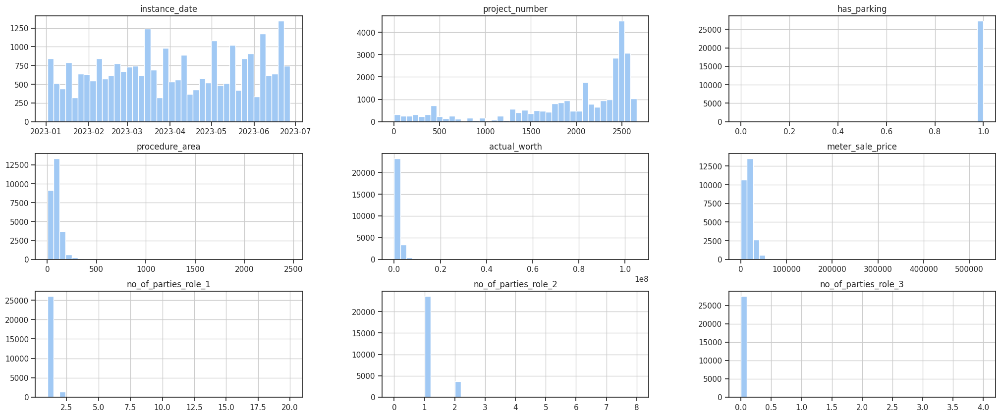

In [ ]:
df.hist(figsize=(25, 10), bins=40)
plt.show()

Text(0, 0.5, 'Actual worth')

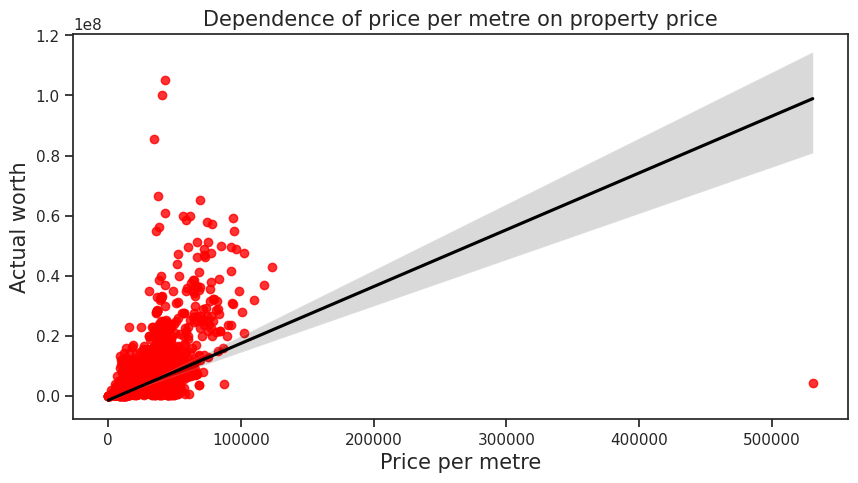

In [ ]:
plt.figure(figsize=(10,5))

ax = sns.regplot(x = 'meter_sale_price' , y = 'actual_worth', data = df, fit_reg= True, scatter_kws= {'color':'red'}, line_kws={'color':'black'})
plt.title('Dependence of price per metre on property price',fontsize=15)
plt.xlabel('Price per metre',fontsize=15)
plt.ylabel('Actual worth',fontsize=15)

> Видим, что зависимость в наших данных не совсем линейна, так как я думаю, что не только цена за метр будет играть ключевую роль в цене объекта недвижимости, а еще дополнительные признаки:площадь объекта,район,инфраструктура рядом,близость к ключевым местам Дубая.

Text(0, 0.5, 'Actual worth')

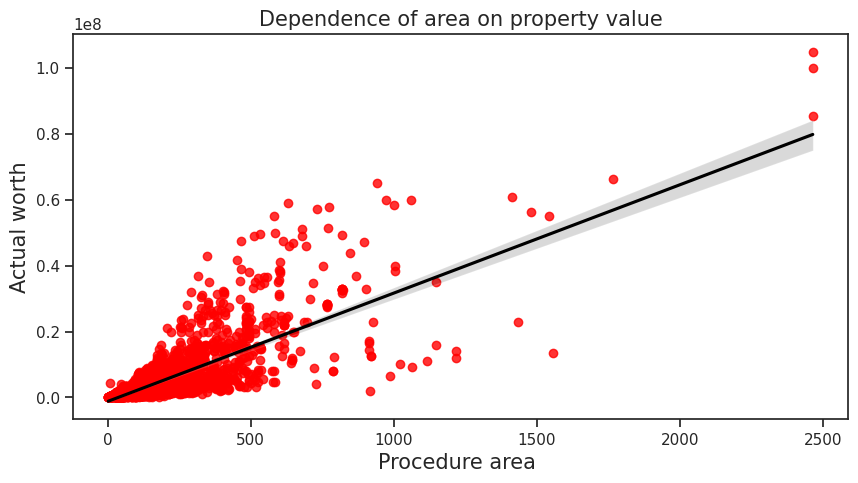

In [ ]:
plt.figure(figsize=(10,5))
ax = sns.regplot(x = 'procedure_area' , y = 'actual_worth', data = df, fit_reg= True, scatter_kws= {'color':'red'}, line_kws={'color':'black'})

plt.title('Dependence of area on property value',fontsize=15)
plt.xlabel('Procedure area ',fontsize=15)
plt.ylabel('Actual worth',fontsize=15)

> В этом случае уже все более очевидно, тут видна линейность, таким образом, при увеличение площади недвижимости растет и цена объекта соответственно.

<ipython-input-25-aefa85cac169>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'has_parking' , y='actual_worth', data=df, palette='viridis')


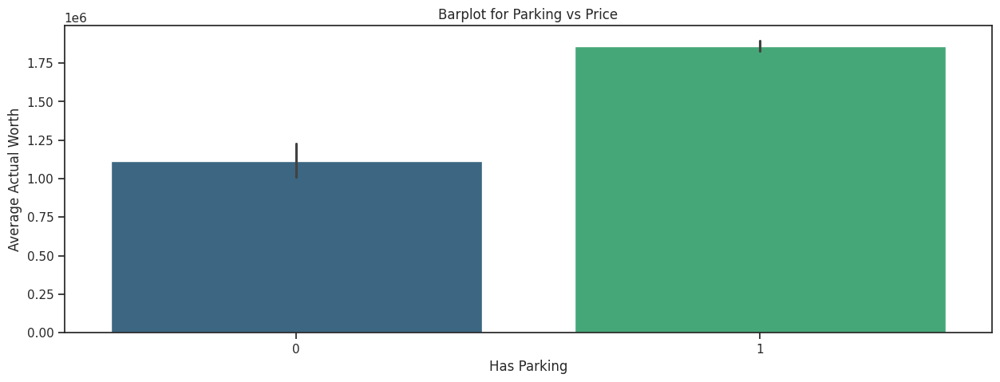

In [ ]:
# Построение bar plot для визуализации распределения типов недвижимости с целевой переменной цены недвижимости
plt.figure(figsize=(15,5))
sns.barplot(x = 'has_parking' , y='actual_worth', data=df, palette='viridis')
plt.title(f'Barplot for Parking vs Price')
plt.xlabel('Has Parking')
plt.ylabel('Average Actual Worth')
plt.show()

In [ ]:
fig_pie = px.pie(data_frame=df, names='has_parking', title='Distribution of parking space availability')
fig_pie.show()

> Видно, что средняя стоимость проданного жилья с парковочным местом выше,что является весьма закономерным явлением, так как квартиры с паркингом стоят больше, чем без. Конечно в наших данных преобладает проданное имущество с парковочным местом, но среднняя величина расчитанная в графике выше(barplot) подтверждает то, что имущество с парковкой стоит дороже.

In [ ]:
px_meter = px.histogram(df, x='meter_sale_price')
px_meter.show()

>График распределения цены за квадратный метр показывает, что большинство транзакций сосредоточено в более низком ценовом сегменте, с пиком около начального значения, которое можно предположить как среднюю рыночную цену. Распределение имеет длинный правый "хвост", что указывает на наличие сделок с высокой стоимостью за квадратный метр, хотя их количество значительно меньше.

-  Гипотезы:
     * Вероятно, что спрос на недвижимость в Дубае в основном приходится на более экономичные варианты.
     * Может существовать корреляция между ценой за квадратный метр и другими факторами,такими как расположение и доступность инфраструктуры.(Подтверждение этой гипотезы будет изображено в Блоке 4)


In [ ]:
px_area = px.histogram(df, x='procedure_area')
px_area.show()

>На этом графике распределения площади недвижимости можно заметить, что большинство транзакций приходится на объекты с меньшей площадью, с двумя пиками, которые могут указывать нам на то, что,возможно, существуют популярные стандарты размеров для квартир или других объектов недвижимости. Также справа можно увидеть хвост, который указывает на относительно небольшое кол-во транзакций с достаточно крупными объектами.

* Гипотеза:
    * Возможно, наличие двух пиков может указывать на популярные категории площадей, например, студии и одно/двухкомнатные квартиры.

***Данную гипотезу можно не отвергнуть/отвергнуть посмотрев на Блок 4(Rooms)***

## 3. Time Series Analysis

In [ ]:
# Первоначально разобьем дату на год, месяц, день
df['year'] = df.instance_date.dt.year
df['month'] = df.instance_date.dt.month
df['day'] = df.instance_date.dt.day


month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June'}
# Создание нового столбца с названиями месяцев
df['month_name'] = df['month'].map(month_names)
month_order = list(month_names.values())

> Поскольку у меня период полугодовой, то рассматривать годовые тенденции на рынке недвижимости Дубая не имеется возможности, поэтому буду рассматривать месячные данные.

In [ ]:
fig = px.histogram(df, x='month_name', y='actual_worth', title='Monthly actual value of real estate sold in Dubai',
                  category_orders={'month_name': month_order})

fig.update_layout(bargap=0.3, margin=dict(l=20, r=20, t=50, b=20))
fig.update_yaxes(title_text='Sum of real estate sold')
fig.update_xaxes(title_text='Month')

fig.show()

> Месяцы май, июнь и март показали наибольшую общую стоимость продаж недвижимости. Это может указывать на то, что в эти месяцы были совершены сделки с более дорогими объектами недвижимости или что объем продаж был выше, что подтверждается графиком ниже. Хотя количество транзакций в январе месяце было не самым высоким, общая стоимость продаж была значительной. Это может свидетельствовать о том, что в январе продавались более дорогие или более крупные объекты недвижимости, поскольку практически входит в топ-3 самых прибыльных месяцев "незначительно" отставая от марта.

* Гипотеза:
    * Возможно,высокая стоимость продаж в мае и июне может быть связана с началом летнего сезона, когда активность на рынке недвижимости традиционно увеличивается.

> Можно заглянуть по ссылке (https://tranio.ru/articles/itogi-mesyaca-na-rynke-nedvizhimosti-dubaya-v-avguste-kolichestvo-sdelok-vyroslo-v-dva-raza-po-sravneniyu-s-proshlym-godom/) и посмотреть графики, посокльку они частично показывают такие же тенденции на рынке недвижимости в Дубае за 2021 и 2022 год, которые отражены и у меня по месяцам. Можно предположить, что это отражает потенциальную сезонность на рынке или иные факторы, которые повлияли на динамику продаж.

Text(0, 0.5, 'Number of transactions')

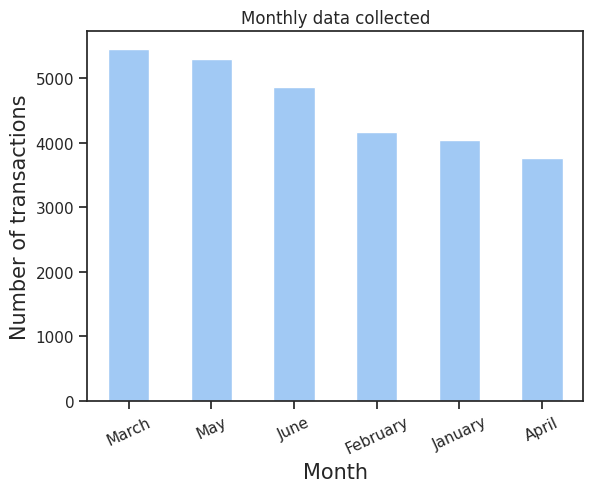

In [ ]:
df.month_name.value_counts().plot(kind='bar', title='Monthly data collected')
plt.xticks(rotation=25) # Поворот значений по оси X на 25 градусов
plt.xlabel('Month',fontsize=15)
plt.ylabel('Number of transactions',fontsize=15)

> На данном графике изображено помесячное количество транзакций

In [ ]:
fig = px.histogram(df, x='month_name', y='actual_worth', title='Monthly actual value of real estate sold in Dubai in the use group',
                   facet_col='property_usage_en', category_orders={'month_name': month_order},
                   facet_col_wrap= 3,
                   width=1000, height=500)

fig.update_layout(bargap=0.3, margin=dict(l=20, r=20, t=50, b=20))
fig.update_xaxes(title_text='Month')

fig.show()

> Значительные суммы продаж жилой недвижимости были совершены каждый месяц, с наименьшей стоимостью в феврале и апреле и пиками в марте и июне. Это может указывать на то, что жилая недвижимость является наиболее стабильным и востребованным сегментом рынка.Стабильно низкая сумма продаж в каждый месяц в группах Commercial и Рospitality по сравнению с жилой недвижимостью может отражать меньший объем рынка или более высокую стоимость отдельных объектов, приводящих к меньшему количеству транзакций.При рассмотрении остальных типов недвижимости графики динамики продаж по месяцам будут схожие, поскольку они являются подмножеством общего объема продаж объектов недвижимости.



## 4. Property Type Analysis

> На представленных графиках можно проследить иерархию по ценовой составляющей в данных группах в среднем. Barplot показывает среднее значение и отображаются доверительные интервалы, представляющие диапазон значений, в котором с определенной вероятностью (обычно 95%) ожидается нахождение значений из нашей целевой группы. Таким образом можно явно проследить в какой группе будут иметься завышенные или заниженные ожидания относительно цены объекта в среднем!

### Property Types

<ipython-input-33-e796c865aa1e>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




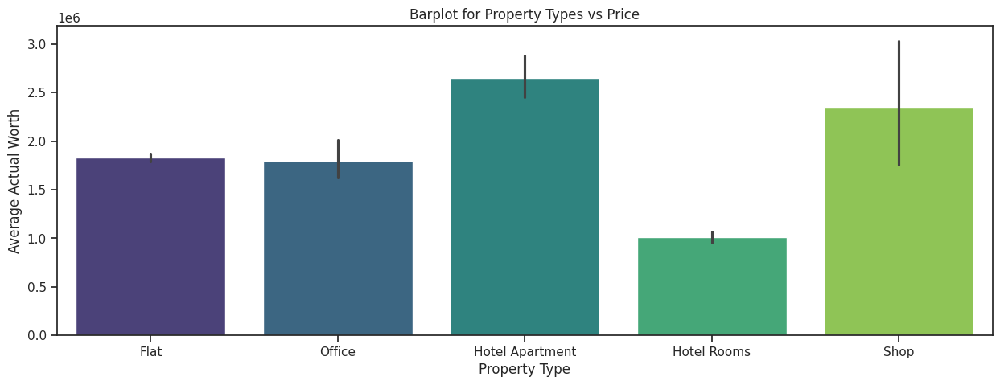

In [ ]:
# Построение bar plot для визуализации распределения типов недвижимости с целевой переменной цены недвижимости
plt.figure(figsize=(15,5))
sns.barplot(x = 'property_sub_type_en' , y='actual_worth', data=df, palette='viridis')
plt.title(f'Barplot for Property Types vs Price')
plt.xlabel('Property Type')
plt.ylabel('Average Actual Worth')
plt.show()

> - Самая высокая средняя цена - более 2,5 миллионов - у Hotel Apartments.
> - Магазины занимают второе место по средней цене - около 2,3 миллионов.
> - Квартиры и офисы имеют схожие средние цены, чуть ниже 2 миллионов.
> - Гостиничные номера имеют самую низкую среднюю цену среди представленных категорий - около 1 миллиона.

> На графике видно, что апартаменты в отелях в среднем являются самым дорогим типом недвижимости среди перечисленных, а номера в отелях - самым дешевым. Доверительные интервалы указывают на то, что цены на практически на каждый тип недвижимости варьируются в широком диапазоне, при этом цены магазины наиболее широки, что указывает на большую разницу в стоимости недвижимости в этой категории. Офисы имеют наименьшую погрешность, что указывает на меньшую вариативность цен.

In [ ]:
# Построение bar plot для визуализации объемов распределения типов недвижимости
fig_bar = px.histogram(df, x='property_sub_type_en', title='Distribution of Property Types')
fig_bar.update_layout(xaxis_title='Property Type', yaxis_title='Count')

# Построение pie chart для визуализации объемов распределения типов недвижимости
fig_pie = px.pie(data_frame=df, names='property_sub_type_en', title='Distribution of Property Types')

# Вывод графиков
fig_bar.show()
fig_pie.show()

>Рынок жилой недвижимости в Дубае сосредоточен в основном на квартирах. Они значительно преобладают на рынке, составляя подавляющее большинство всех сделок, что подтверждается круговой диаграммой. Другие типы недвижимости в сумме занимают менее 10% рынка для моих данных, которые отобраны за  первое полугодие 2023. Таким образом, коммерческая недвижимость, включая офисы и магазины, и сегменты с гостиничными апартаментами и номерами, занимают гораздо меньшую часть рынка.

* Гипотезы:
    * Предпочтение квартир может быть связано с высокой ликвидностью этого типа недвижимости
    * Меньшее количество сделок с коммерческой недвижимостью и гостиничной недвижимостью может отражать более высокую стоимость объектов


### Property Usage Types

<ipython-input-35-4c9fb4916593>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




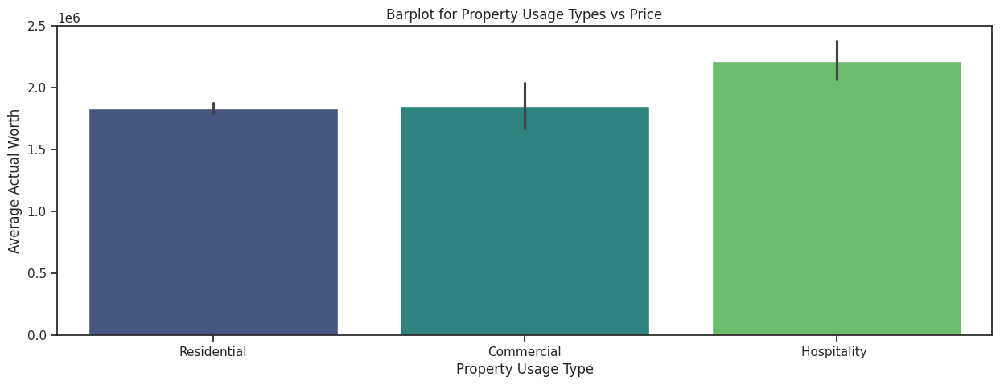

In [ ]:
# Построение bar plot для визуализации распределения типов недвижимости с целевой переменной цены недвижимости
plt.figure(figsize=(15,5))
sns.barplot(x = 'property_usage_en' , y='actual_worth', data=df, palette='viridis')
plt.title(f'Barplot for Property Usage Types vs Price')
plt.xlabel('Property Usage Type')
plt.ylabel('Average Actual Worth')
plt.show()

> Гостиничная недвижимость имеет самую высоку среднюю стоимость, что может говорить об её важности как инвестиционного актива, особенно в городе с высоким потоком туристов. Коммерческая недвижимость имеет высокую среднюю стоимость, что может свидетельствовать о высокой ценности в рамках коммерческого использования недвижимости. Жилая недвижимость наиболее распространена, её средняя стоимость ниже всех в этой группе, что может отражать более широкий диапазон цен на этот сегмент в сфере недвижимости.



* Гипотезы:
    * Вложения в гостиничную недвижимость в Дубае являются особенно привлекательными и прибыльными из-за особенности города, а именно высокого туристического потока.
    * Жилая недвижимость, может предлагать более высокую ликвидность и доступность для широкого круга покупателей в силу низкой средней стоимости.
    * Возможно, на рынке коммерческой и гостиничной недвижимости высокая конкуренция, что является ключевым факторам, который повышает стоимость этих объектов.

In [ ]:
# Построение bar plot для визуализации объемов распределения недвижимости в использовании
fig_bar = px.histogram(df, x='property_usage_en', title='Distribution of Property Usage Types')
fig_bar.update_layout(xaxis_title='Property Usage Type', yaxis_title='Count')

# Построение круговой диаграммы для визуализации объемов распределения недвижимости в использовании
fig_pie = px.pie(data_frame=df, names='property_usage_en', title='Distribution of Property Usage Types')

# Вывод графиков
fig_bar.show()
fig_pie.show()

> Жилая недвижимость доминирует на рынке, что указывает на высокий спрос и большое количество жилой недвижимости в Дубае.Коммерческая недвижимость и гостиничная недвижимость имеют меньшее количество транзакций, что может отражать более высокую стоимость и нижнюю ликвидность по сравнению с жилой недвижимостью.

>Гипотезы будут схожи в блоком про среднюю стоимость поскольку коммерческая недвижимость и гостиничная недвижимость могут предлагать более высокую доходность, но с более высоким порогом входа и рисками, поэтому количество транзакций по ним не такое большое, как, например, в сегменте жилой недвижимости. Дубай является привлекательным местом для международного туризма, то и инвесторы предпочитают приобретать более ликвидный продукт на рынке жилья для последующей продажи или сдачи в аренду.



### Reg. Types

<ipython-input-37-943056ded42d>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




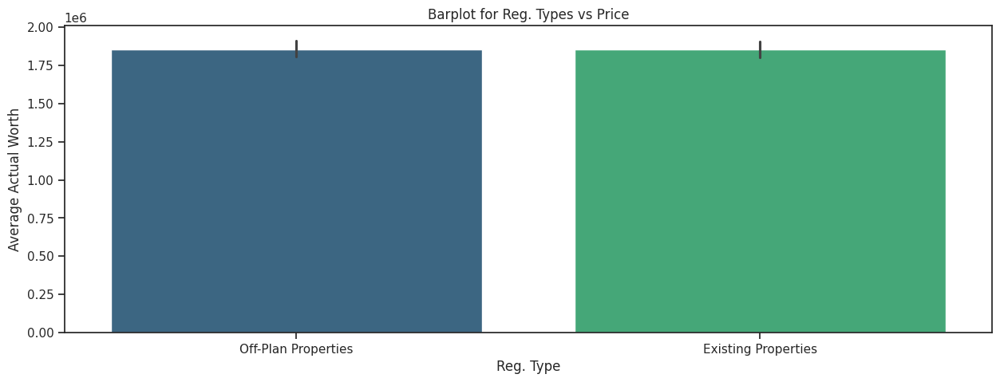

In [ ]:
# Построение bar plot для визуализации распределения типов недвижимости с целевой переменной цены недвижимости
plt.figure(figsize=(15,5))
sns.barplot(x = 'reg_type_en' , y='actual_worth', data=df, palette='viridis')
plt.title(f'Barplot for Reg. Types vs Price')
plt.xlabel('Reg. Type')
plt.ylabel('Average Actual Worth')
plt.show()

> По представленным графикам и значениям средней стоимости недвижижмости этом сегменте можно сделать следующие выводы: 1)Инвесторы могут быть готовы платить премию за существующие объекты из-за меньшего риска и немедленной возможности использования или получения дохода от аренды. 2)Объекты, которые еще находятся в стадии планирования, могут предлагаться со скидкой, чтобы привлечь покупателей, несмотря на связанные с этим риски.

* Гипотезы:
    * Возможно, что цены на объекты в стадии планирования могут возрасти после их завершения, что делает их привлекательными для инвесторов, готовых принять соответствующие риски.
    * Существующая недвижимость может иметь более высокую среднюю стоимость из-за своего местоположения и меньшего количества неизвестных факторов, то есть инвестор или покупатель несет меньшие риски при покупке такого жилья.



In [ ]:
# Построение bar plot для визуализации объемов распределения регистр. типов недвижимости
fig_bar = px.histogram(df, x='reg_type_en', title='Distribution of Reg. Types')
fig_bar.update_layout(xaxis_title='Property Usage Type', yaxis_title='Count')

# Построение круговой диаграммы для визуализации объемов распределения регистр. типов недвижимости
fig_pie = px.pie(data_frame=df, names='reg_type_en', title='Distribution of Reg. Types')

# Вывод графиков
fig_bar.show()
fig_pie.show()

> - Off-Plan Properties: Этот сегмент составляет большинство сделок, что может указывать на активное строительство и развитие новых объектов недвижимости в Дубае, а также на высокий спрос на новостройки. Этот сегмент занимает 58.3% рынка.
> - Existing Properties: Данные объекты тоже составляют значительную часть рынка(41.7%), но их доля немного меньше по сравнению с объектами на стадии планирования.

* Гипотезы:
    * Существующие объекты могут быть более предпочтительными для покупателей, поскольку они знают всю информацию о районе и инфрастурктуре и не несут рисков со строительством жилья.
    * Возможно, более низкие цены или ожидаемое увеличения стоимости недвижимости по завершению строительства в сегменте на стадии планирования.




### Rooms

<ipython-input-39-74b31e0f1363>:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




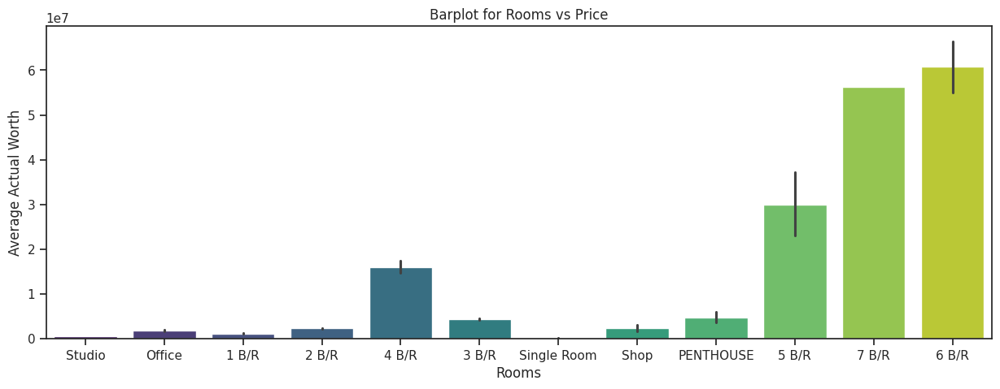

In [ ]:
# Построение bar plot для визуализации распределения количества комнат в собственности с целевой переменной цены недвижимости
plt.figure(figsize=(15,5))
sns.barplot(x = 'rooms_en' , y='actual_worth', data=df, palette='viridis')
plt.title(f'Barplot for Rooms vs Price')
plt.xlabel('Rooms')
plt.ylabel('Average Actual Worth')
plt.show()

> Существует явная корреляция между количеством спален в жилой недвижимости и ее средней стоимостью, что отражает как увеличение площади, так и переход к более премиальным сегментам рынка с увеличением количества спален. Пентхаусы и крупные жилые объекты с 5 и более спальнями могут классифицироваться, как премиальный сегмент. Также стоит заметить, что  4-спальные квартиры заметно увеличились в средней стоимости относительно 1-2-3 спальных квартир, что может отражать переход к более премиальному сегменту рынка.

* Гипотезы:
    * Пентхаусы или большие квартиры могут быть в приоритетом при покупке у более обеспеченных слоев населения или у инвесторов для совершения крупных инвестиций/сделок.
    * Недвижимость с меньшим количеством спален может быть более доступна для индивидуальных покупателей или молодых семей.

In [ ]:
# Построение bar plot для визуализации объемов распределения комнат в недвижимости
fig_bar = px.histogram(df, x='rooms_en', title='Distribution of Rooms')
fig_bar.update_layout(xaxis_title='Rooms', yaxis_title='Count')

# Построение круговой диаграммы для визуализации объемов распределения комнат в недвижимости
fig_pie = px.pie(data_frame=df, names='rooms_en', title='Distribution of Rooms')

# Вывод графиков
fig_bar.show()
fig_pie.show()

> На основе круговой диограммы можно частично подтвердить гипотезы, которые я выдвинул ранее, потому что средний сегмент рынка недвижимости (1 и 2-спальные квартиры, студии) доминирует в Дубае, что может свидетельствовать о высоком спросе со стороны малых семей или индивидуальных инвесторов. Большие объекты недвижимости, такие как пентхаусы и квартиры с большим количеством спален, составляют лишь небольшую часть рынка, что отражает их эксклюзивность и высокую стоимость. Гипотезы для этого блока будут схожи с блоком выше, так как тут мы видим распределение между разными видами жилья, что четко дает нам понять и среднюю стоимость недвижимости в регионе.

### Procedure Names

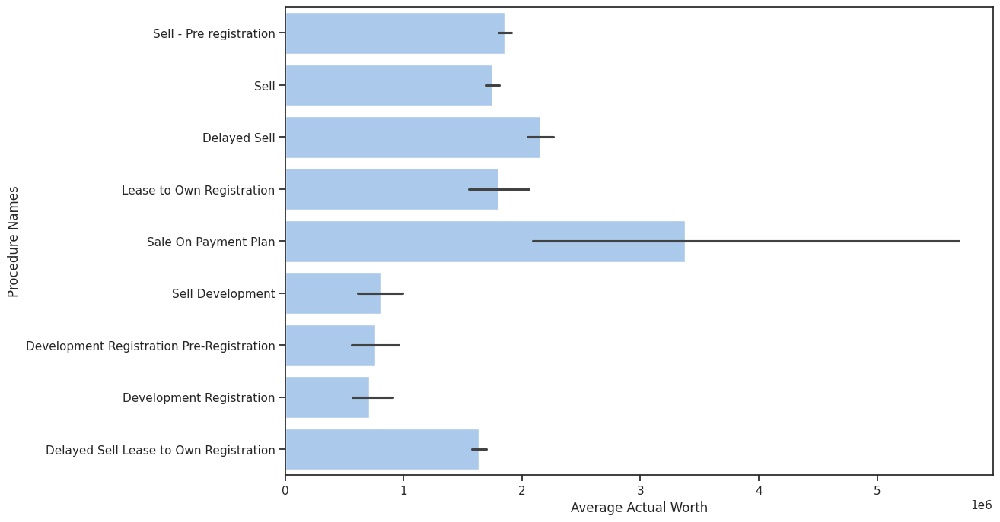

In [ ]:
plt.figure(figsize=(12, 8))
sns.barplot(data=df, y='procedure_name_en', x='actual_worth')
plt.xlabel('Average Actual Worth')
plt.ylabel('Procedure Names')
plt.show()

> Самая длинная горизонтальная полоса, представляющая наибольшую стоимость, относится к процедуре "Sale On Payment Plan", что указывает на то, что продажи по платёжному плану имеют самую большую фактическую стоимость среди всех представленных процедур. Далее следует "Lease to Own Registration" с меньшей стоимостью, но также значительной. Короткие полосы представляют процедуры с меньшей стоимостью, например "Delayed Sell Lease to Own Registration", что может указывать на меньший объём сделок или меньшую стоимость этих процедур.

>Полосы с большими чёрными линиями, такие как "Sale On Payment Plan", указывают на большую вариабельность стоимости этой процедуры. Это может быть связано с различиями в условиях контрактов, в стоимости объектов недвижимости или в других факторах, влияющих на конечную стоимость.

>Процедуры в нижней части графика, такие как "Development Registration Pre-Registration" и "Development Registration", имеют схожую стоимость, что может говорить о том, что эти процедуры являются альтернативными вариантами друг друга или схожи по своей природе

In [ ]:
# Построение bar plot для визуализации объемов распределения процедуры при продаже недвижимости
fig_bar = px.histogram(df, x='procedure_name_en', title='Distribution of Procedure names')
fig_bar.update_layout(xaxis_title='Procedure', yaxis_title='Count')

# Построение круговой диаграммы для визуализации объемов распределения процедуры при продаже недвижимости
fig_pie = px.pie(data_frame=df, names='procedure_name_en', title='Distribution of Procedure names')

# Вывод графиков
fig_bar.show()
fig_pie.show()

> - Продажа с предварительной регистрацией - это наиболее распространенная процедура(58.3%), что может отражать популярность покупки недвижимости на ранних этапах разработки проекта. Продажа - это следующая по популярности процедура(30.9%), что свидетельствует о традиционной купле-продаже недвижимости. Отложенная продажа занимает меньшую долю рынка(10.3%), но все же значимую, что может указывать на нестандартные условия сделок или предпочтения покупателей. Остальные сделки являются достаточно редкими процедурами при покупке недвижимости(<0.5%), что, возможно, указывает на какие-то конкретные специфические этапы или схемы при покупке недвижимости.

* Гипотезы:
    * Покупатели, возможно, предпочитают покупать недвижимость на ранних этапах, чтобы извлечь выгоду из потенциального увеличения стоимости объекта по его завершении.
    * Отложенные продажи может представлять альтернативные решения для покупателей, не имеющих возможности для сразу полной оплаты объекта.



### Infrastructure dependence on the price per metre of the property

In [ ]:
fig = px.histogram(df, x='nearest_landmark_en', y='meter_sale_price', title='Meter sale price near landmarks of Dubai', color='property_usage_en')
fig.update_yaxes(title_text='Sum of Meter Sale Price')
fig.update_layout(width=800,  height=600)
fig.show()

> Sports City Swimming Academy показывает значительный сумму цен за квадратный метр во трех категориях, с преобладанием жилой недвижимости. Это может отражать высокую стоимость и престижность местоположения. Downtown Dubai здесь также видна значительная сумма по ценам за квадратный метр недвижимости,преимущественно жилой недвижимости.Global Village, IMG World Adventures и Expo 2020 Site показывают меньшую сумму целевого значения, что может быть связано с их коммерческим и развлекательным характером использования.Можно сделать вывод,что близость к Sports City Swimming Academy, Downtown Dubai, Burj Al Arab связаны с высокими ценами на недвижимость, что может отражать их престижность и популярность среди покупателей.

* Гипотеза:
    * Районы вокруг престижных ориентиров, вероятно, будут продолжать привлекать инвесторов и покупателей, ищущих недвижимость премиум и премиум+ класса.

In [ ]:
fig = px.histogram(df, x='nearest_metro_en', y='meter_sale_price', title='Meter sale price near metro of Dubai', color='property_usage_en')
fig.update_yaxes(title_text='Sum of Meter Sale Price')
fig.update_layout(width=1000,  height=700)
fig.show()

> Близость к станциям метро в Дубае сильно коррелирует с высокими ценами на недвижимость, особенно в жилом и коммерческом сегментах.Районы вокруг важных транспортных узлов, как правило, имеют более высокий спрос и стоимость недвижимости, что является ключевым фактором для инвесторов и застройщиков.Недвижимость около станий метро, таких как Burj Khalifa Dubai Mall Metro Station, Creek Metro Station и Dubai Internet City будет иметь высокие цены за квадратный метр. Это может отражать их близость к ключевым торговым и бизнес-центрам, а также к туристическим достопримечательностям. Суммы за квадратный метр недвижимости рядом с Business Bay Metro Station и First Abu Dhabi Bank Metro Station показывают также демонстрируют огромные цифры, что может быть связано с высокой популярностью этих районов для работы, поскольку один из них - это центральный деловой район в Дубае, а другое метро находится рядом с крупнейшим банком Объединённых Арабских Эмиратов. Рядом с другими станциями метро сумма продаж за квадратный метр понижаются, что может указывать на меньшую плотность застройки или более низкие цены на недвижимость. Видно, что большинство продаж приходится на жилую недвижимость, за исключением Burj Khalifa Dubai Mall Metro Station, где доля гостиничной недвижимости заметно выше.

* Гипотезы:
    * Районы вокруг станций метро, расположенные ближе к центру города или крупным коммерческим центрам, будут иметь наибольшую цену за квадратный метр, поскольку граничат со всеми ключевыми объектами этого района, а также предоставляют быстрый доступ к метрополитену, что является одним из ключевых пунктов в покупке жилья.  
    * Станции метро, расположенные в более спокойных или новых районах, возможно, будут иметь более доступные варианты для потенциальных покупателей.

In [ ]:
fig = px.histogram(df, x='nearest_mall_en', y='meter_sale_price', title='Meter sale price near malls of Dubai', color='property_usage_en')
fig.update_yaxes(title_text='Sum of Meter Sale Price')
fig.update_layout(width=800,  height=500)
fig.show()

> Расположение недвижимости рядом с крупными торговыми центрами, как правило, связано с высокой стоимостью за квадратный метр, особенно для жилой недвижимости, что отражает их привлекательность и удобство для жителей и других экономических агентов. Коммерческая и гостиничная недвижимость также представлена вблизи торговых центров, но в меньших объемах, чем в жилом секторе.
Поскольку Dubai Mall является одним из самых известных и посещаемых торговых центров в Дубае, то четко понятно, что данная зависимость будет увеличивать стоимость квадратного метра в объектах недвижимости рядом с ним. Следом идет Marina Mall с значительной суммой продаж за квадратный метр преимущественно в жилом секторе, а вот расположенность рядом с другими торговыми центрами не имеет спроса среди коммерческих и гостиничных инвесторов, что подтверждается графиков, так как доля этих групп там крайне мала.

* Гипотезы:
    * Жилые объекты рядом с крупными торговыми центрами, вероятно, будут продолжать пользоваться спросом из-за удобства расположения и доступности услуг.
    * Коммерческая и гостиничная недвижимость могут иметь потенциал для роста стоимости квадратного метра,если будет стабильный и увеличивающийся трафик посетителей в эти торговые центры.

## 5. Price Distribution

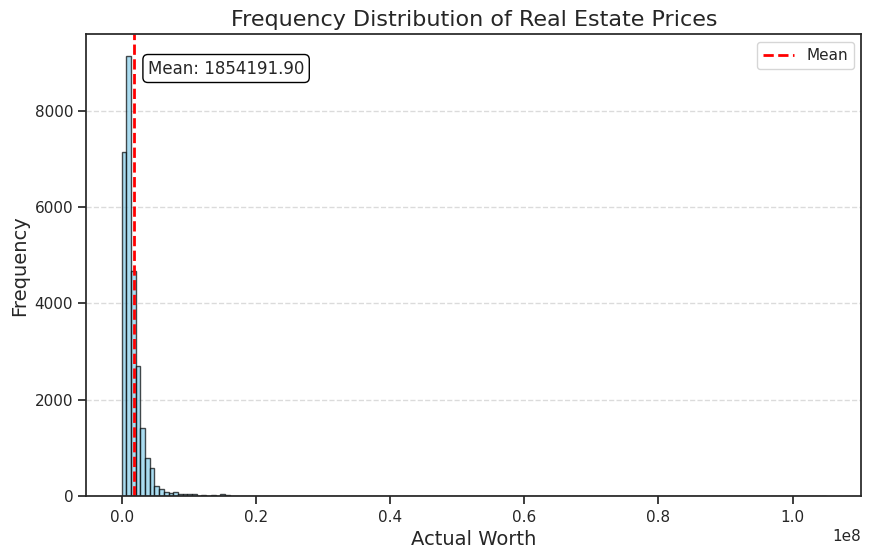

In [ ]:
plt.figure(figsize=(10, 6))


plt.hist(df.actual_worth, bins=150, edgecolor='black', color='skyblue', alpha=0.7)
plt.title('Frequency Distribution of Real Estate Prices', fontsize=16)
plt.xlabel('Actual Worth', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Добавляем сетку

# Добавлю среднее значение на график
mean_value = df.actual_worth.mean()
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label='Mean')  # Линия для среднего значения

# Чтобы лучше было видно среднее значение, то нарисуем рамку вокруг этого значения
bbox_props = dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white")
plt.annotate(f'Mean: {mean_value:.2f}', (mean_value, plt.ylim()[1]*0.9), xytext=(10, 5), textcoords='offset points',
             ha='left', fontsize=12, bbox=bbox_props)

plt.legend()  # легенда средней на графике

plt.show()

> Большинство цен на недвижимость сосредоточено в самом низком диапазоне, с частотой более 12 000 для объектов с самыми низкими ценами. С увеличением цены частота резко падает, указывая на то, что более высокие цены встречаются гораздо реже. График проявляет ярко выраженный правосторонний "хвост", что характерно для распределений с положительным асимметричным смещением. Это типично для данных о ценах на недвижимость, где небольшое количество объектов имеет очень высокую стоимость. Эти объекты смещают среднюю стоимость в сторону "хвоста", отдаляя ее от наиболее часто встречающихся значений, которые имеют наивысшую частоту транзакций.

> Посмотрев на график частоты распределения цен на недвижимость, можно будет сформулировать несколько потенциальных гипотез:
* __Сконцентрированный низший ценовой сегмент:__ Большинство сделок купли-продажи недвижимости сосредоточено в более низком ценовом диапазоне, что указывает на то, что доступное жильё составляет значительную часть рынка.

* __Наличие элитной недвижимости:__ Правый хвост графика, хотя и намного менее часто встречается, указывает на наличие дорогих объектов недвижимости, которые значительно выше средней стоимости.

* __Неравномерность рынка:__ Распределение цен показывает, что рынок недвижимости в Дубае характеризуется большим неравенством цен, с большим количеством недвижимости в низком и среднем ценовых сегментах и относительно небольшим количеством очень дорогих объектов,которые попали в рассматриваемый диапазон времени.

## 6. Location Analysis

> Задачей стоит проанализировать географическое распределение продаж недвижимости в Дубае. Необходимые данные -  это Район,Фактическая стоимость,Координаты района, также можно еще выбрать и сгруппировать Площадь проданной недвижимости и Количество сделок в районе.

In [ ]:
loc_feat = ['area_name_en','procedure_area','actual_worth']
geo_df = df[loc_feat].copy()
# Делаю необходимые манипуляции, чтобы сгруппировать все данные по районам
geo_df['quantity_transactions'] = 0
geo_df = geo_df.groupby('area_name_en').agg({'actual_worth': 'sum','procedure_area':'sum','quantity_transactions':'count'}).reset_index().sort_values(by = ['quantity_transactions'],ascending = False).reset_index(drop = True)
geo_df.head(15)

,area_name_en,actual_worth,procedure_area,quantity_transactions
0,Al Barsha South Fourth,4.666372e+09,413412.55,5900
1,Business Bay,5.433650e+09,266648.06,3076
2,Al Khairan First,7.126798e+09,322276.97,2999
3,Burj Khalifa,8.548691e+09,284333.61,2099
4,Al Thanyah Fifth,2.617642e+09,186918.02,2064
5,Al Barshaa South Third,1.208651e+09,102972.99,1721
6,Marsa Dubai,3.915316e+09,171926.24,1496
7,Hadaeq Sheikh Mohammed Bin Rashid,2.523371e+09,126428.28,1456
8,Palm Jumeirah,7.734784e+09,203624.74,1022
9,Jabal Ali First,7.452273e+08,69777.25,925


> Сделаем визуализацию данных с помощью круговой диаграммы и гистограммы, чтобы посмотреть географическое распределение продаж недвижимости по районам

In [ ]:
fig = px.pie(geo_df.head(10), values='quantity_transactions', names='area_name_en', title='Top 10 neighbourhoods by sales')
fig.show()
# На круговой диаграмме отображено распределение 10 районов с максимальным количеством продаж недвижимости в процентном формате

In [ ]:
fig = px.bar(geo_df, x='area_name_en', y='actual_worth',
             labels={'area_name_en': 'Neighbourhood', 'actual_worth': 'Total cost of sales'},
             title='Geographical distribution of property sales in Dubai',
             orientation='v',
             color='quantity_transactions' #Если хочется посмотреть на бины с цветовой палитрой в зависимости от кол-ва сделок
             # optional
            )

# Добавим аннотации для каждого бина
for i, row in geo_df.iterrows():
    fig.add_annotation(
        x=row['area_name_en'],
        y=row['actual_worth'],
        text=str(row['quantity_transactions']),  # Здесь добавляем число транзакций
        showarrow=True,
         arrowhead=4,
        ax=0,
        ay=-40,
        name='Transactions'
    )


fig.update_layout(xaxis=dict(tickangle=45), yaxis=dict(title='Total cost of sales'))
fig.update_layout(width=1000, height=700)
fig.show()

> По графику видно, что лидерами по общей сумме продаж являются районы:
* Burj Khalifa - 2099 сделок купли-продажи
* Palm Jumeirah - 1022 сделок купли-продажи
* Al Khairan First - 2999 сделок купли-продажи

> Из графика видно, что районы Burj Khalifa и Palm Jumeirah не являются первыми по количеству сделок, однако, имеют самую большую прибыль - это говорит о том, что в этих районах сконцентрированы дорогостоящие объекты недвижимости, которые своей стоимостью сильно отличны от других районов в выборке. И можно предположить о том, что в этих районах средняя цена за квадратный метр и средняя цена за объект недвижимости будут выше.Следует также отметить, что район с наибольшим количеством транзакций — Al Barsha South Fourth, является развивающимся районом, что является достаточно логичным паттерном.

> __Следующим этапом необходимо получить координаты для выбранных районов. Это можно сделать с использованием имеющейся у меня функции, которая извлекает координаты районов из базы данных через API. Необходимо добавить информацию о широте (Latitude) и долготе (Longitude).__

In [ ]:
def get_coordinates(address):
    adress = f"{address}, Dubai, UAE"
    geolocator = Nominatim(user_agent="NK")
    location = geolocator.geocode(address)
    return (location.latitude, location.longitude) if location else (None, None)

# Применение функции к DataFrame для заполнения широты и долготы
geo_df[['latitude', 'longitude']] = geo_df['area_name_en'].apply(lambda x: pd.Series(get_coordinates(x)))
geo_df.head()

,area_name_en,actual_worth,procedure_area,quantity_transactions,latitude,longitude
0,Al Barsha South Fourth,4.666372e+09,413412.55,5900,NaN,NaN
1,Business Bay,5.433650e+09,266648.06,3076,25.189427,55.264819
2,Al Khairan First,7.126798e+09,322276.97,2999,NaN,NaN
3,Burj Khalifa,8.548691e+09,284333.61,2099,25.197031,55.274222
4,Al Thanyah Fifth,2.617642e+09,186918.02,2064,NaN,NaN


> К сожалению не всем районам в Дубае алгоритм нашел координаты,поскольку многие написаны не как на картах(где то first,second, а на картах 1 или 2 стоит). Я пробовал разные алгоритмы и практически все работают одинаково и находят координаты только для тех, которые мы видим. Следовательно, необходимо самому дозаполнить коррдинаты к районам и добавить в датасет.

In [ ]:
json_data_with_coordinates = [
    {'area_name_en': 'Al Barsha South Fourth', 'latitude': 25.058345, 'longitude': 55.208889},
    {'area_name_en': 'Al Khairan First','latitude': 25.196252, 'longitude': 55.359882},
    {'area_name_en': 'Al Thanyah Fifth', 'latitude': 25.051959, 'longitude': 55.15578},
    {'area_name_en': 'Al Barshaa South Third', 'latitude': 25.061254, 'longitude': 55.238035},
    {'area_name_en': 'Jabal Ali First', 'latitude': 25.034781, 'longitude': 55.130706},
    {'area_name_en': 'Al Hebiah Fourth', 'latitude': 25.027205 , 'longitude': 55.222102},
    {'area_name_en': "Me'Aisem First", 'latitude':25.019562 , 'longitude': 55.184658},
    {'area_name_en': 'Al Barshaa South Second', 'latitude':25.073998 , 'longitude':55.230325},
    {'area_name_en': 'Al Barsha South Fifth', 'latitude': 25.047709, 'longitude':55.190917 },
    {'area_name_en': 'Al Merkadh', 'latitude': 25.169148, 'longitude': 55.287184},
    {'area_name_en': 'Business Bay', 'latitude': 25.1894, 'longitude': 55.264851},
    {'area_name_en': 'Burj Khalifa', 'latitude': 25.1970, 'longitude': 55.2742},
    {'area_name_en': 'Marsa Dubai', 'latitude': 25.080549, 'longitude': 55.136670},
    {'area_name_en': 'Hadaeq Sheikh Mohammed Bin Rashid', 'latitude': 25.1190, 'longitude': 55.2619},
    {'area_name_en': 'Palm Jumeirah', 'latitude': 25.1181, 'longitude': 55.1342},
    {'area_name_en': 'Al Kifaf', 'latitude': 25.2346, 'longitude': 55.2986},
    {'area_name_en': 'Al Jadaf', 'latitude': 25.2219, 'longitude': 55.3359},
    {'area_name_en': 'Al Wasl', 'latitude': 25.1959, 'longitude': 55.2557},
    {'area_name_en': 'Mirdif', 'latitude': 25.2151, 'longitude': 55.4089},
    {'area_name_en': 'Madinat Dubai Almelaheyah', 'latitude': 25.264795, 'longitude': 55.265751},
    {'area_name_en': 'Al Hebiah First', 'latitude':25.04655 , 'longitude': 55.236942},
    {'area_name_en': 'Zaabeel Second', 'latitude': 25.205399, 'longitude': 55.29557},
    {'area_name_en': 'Al Thanyah First', 'latitude': 25.098348 , 'longitude': 55.175776},
    {'area_name_en': 'Nad Al Shiba First', 'latitude': 25.148706 , 'longitude':55.314382},
    {'area_name_en': 'Al Thanyah Third', 'latitude': 25.084567, 'longitude': 55.163891},
    {'area_name_en': 'Jabal Ali Industrial Second', 'latitude': 24.954746, 'longitude':55.105023 },
    {'area_name_en': 'Al Safouh Second', 'latitude': 25.099053, 'longitude': 55.160781},
    {'area_name_en': 'Al Safouh First', 'latitude': 25.119877, 'longitude': 55.180831},
    {'area_name_en': 'Al Warsan First', 'latitude': 25.165256, 'longitude': 55.409876},
    {'area_name_en': 'Dubai Investment Park First', 'latitude':24.990351 , 'longitude':55.167311},
    {'area_name_en': 'Al Hebiah Second', 'latitude': 25.034947, 'longitude': 55.245964}]

json_df = pd.DataFrame(json_data_with_coordinates)

In [ ]:
geo_merge_df = pd.merge(geo_df, json_df, on='area_name_en', how='left', suffixes=('', '_json')
                       ).drop(columns = ['latitude','longitude']).rename(columns = {'latitude_json':'latitude','longitude_json':'longitude'})
geo_merge_df.head()

,area_name_en,actual_worth,procedure_area,quantity_transactions,latitude,longitude
0,Al Barsha South Fourth,4.666372e+09,413412.55,5900,25.058345,55.208889
1,Business Bay,5.433650e+09,266648.06,3076,25.189400,55.264851
2,Al Khairan First,7.126798e+09,322276.97,2999,25.196252,55.359882
3,Burj Khalifa,8.548691e+09,284333.61,2099,25.197000,55.274200
4,Al Thanyah Fifth,2.617642e+09,186918.02,2064,25.051959,55.155780


> Теперь когда наш датасет полностью готов можно построить карту и отобразить наши районы там. Изначально я отображу просто районы без модификаций, чтобы посмотреть, что все нормально отрабатывает. Далее можно будет выделить районы на основе проданной недвижимости, площади жилья и количества сделок. Это можно будет сделать через тепловую карту и с помощью маркера, который будет увеличиваться при грейдировании по шкале непрерывной переменной.

### Drawing of Dubai neighbourhoods on the map

In [ ]:
# Чтобы было удобно читать информацию на маркере, то можно перевести цифры с сокращениями в строковый режим
def format_number(num):
    if 1e9 <= abs(num) < 1e12:
        return f'{num / 1e9:.2f} B(млрд.)'
    elif 1e6 <= abs(num) < 1e9:
        return f'{num / 1e6:.2f} M(млн.)'
    elif 1e3 <= abs(num) < 1e6:
        return f'{num / 1e3:.2f} K(тыс.)'
    else:
        return f'{num:.2f}'

# Чтобы сразу отобразить и общую проданную площадь объектов в районе можно использовать след функцию
# Для форматирования площади в строку с указанием "тысяч" или "миллионов" и добавлением "км²"
def format_area(area):
    if 1e6 <= area < 1e9:
        return f'{area / 1e6:.2f} M(млн.) km²'
    elif 1e3 <= area < 1e6:
        return f'{area / 1e3:.2f} K(тыс). km²'
    else:
        return f'{area:.2f} км²'

geo_merge_df['total_str_worth'] = [format_number(num) for num in geo_merge_df.actual_worth]
geo_merge_df['total_str_area'] = [format_area(area) for area in geo_merge_df.procedure_area]

#Также еще для информативности можно сделать расчет средней цены на недвижимость и средней цены цены за квадратный метр в раойне

def mean_price_real_estate(row):
    return row['actual_worth']/row['quantity_transactions']

def mean_price_per_metre(row):
    return row['actual_worth']/row['procedure_area']

geo_merge_df['average_property_price'] = geo_merge_df.apply(mean_price_real_estate, axis=1)
geo_merge_df['average_price_per_metre'] = geo_merge_df.apply(mean_price_per_metre, axis=1)
# также к этим колонкам нужно сделать тектовые для визуализации на карте
geo_merge_df['average_str_price'] = [format_number(num) for num in geo_merge_df.average_property_price]
geo_merge_df['average_str_price_per_metre'] = [format_number(num) for num in geo_merge_df.average_price_per_metre]

geo_merge_df.head()

,area_name_en,actual_worth,procedure_area,quantity_transactions,latitude,longitude,total_str_worth,total_str_area,average_property_price,average_price_per_metre,average_str_price,average_str_price_per_metre
0,Al Barsha South Fourth,4.666372e+09,413412.55,5900,25.058345,55.208889,4.67 B(млрд.),413.41 K(тыс). km²,7.909106e+05,11287.447377,790.91 K(тыс.),11.29 K(тыс.)
1,Business Bay,5.433650e+09,266648.06,3076,25.189400,55.264851,5.43 B(млрд.),266.65 K(тыс). km²,1.766466e+06,20377.608860,1.77 M(млн.),20.38 K(тыс.)
2,Al Khairan First,7.126798e+09,322276.97,2999,25.196252,55.359882,7.13 B(млрд.),322.28 K(тыс). km²,2.376392e+06,22113.892653,2.38 M(млн.),22.11 K(тыс.)
3,Burj Khalifa,8.548691e+09,284333.61,2099,25.197000,55.274200,8.55 B(млрд.),284.33 K(тыс). km²,4.072745e+06,30065.706573,4.07 M(млн.),30.07 K(тыс.)
4,Al Thanyah Fifth,2.617642e+09,186918.02,2064,25.051959,55.155780,2.62 B(млрд.),186.92 K(тыс). km²,1.268237e+06,14004.225799,1.27 M(млн.),14.00 K(тыс.)


> На этой карте представлена визуализация районов с подробной информацией о каждом из них.

In [ ]:
# Создание карты
map = folium.Map(location=[geo_merge_df['latitude'].mean(), geo_merge_df['longitude'].mean()], zoom_start=10)

# Создание кластера маркеров
marker_cluster = MarkerCluster().add_to(map)

# Добавление маркеров с подписями и разными стилями
for i, row in geo_merge_df.iterrows():
    popup_text = f"<br> <i>District:<i> <b>{row['area_name_en']}</b><br>The total revenue from real estate sales: <b>{row['total_str_worth']}</b><br>The total area of sold real estate: <b>{row['total_str_area']}</b><br>Average property price: <b>{row['average_str_price']}</b><br>Average price per sq. metre: <b>{row['average_str_price_per_metre']}</b>"
    #f"<br> District: {row['area_name_en']}<br>The total revenue from real estate sales: {row['total_str_worth']}<br>The total area of sold real estate: {row['total_str_area']}<br>Average property price: {row['average_str_price']}<br>Average price per sq. metre: {row['average_str_price_per_metre']}"


    # Использование значка "домика"
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='red', icon='home')
    ).add_to(marker_cluster)  # Добавление маркера в кластер

map
# Можно еще сохранить в html формате при необходимости
# map.save('Districts_Dubai.html')

### Mapping Dubai's neighbourhoods on a map with a palette of total revenue rentals

> На этой карте я отметил районы в зависимости от их общей выручки. Чем больше размер маркера и чем ярче он выделен, тем выше сумма продаж недвижимости в этом районе Дубая. Кроме того, внутри маркера содержится вся основная информация о районе.

In [ ]:
fig = px.scatter_mapbox(
    geo_merge_df.rename(columns = {'actual_worth':'Total Worth'}),
    lat="latitude",
    lon="longitude",
    color="Total Worth",
    size="Total Worth",
    color_continuous_scale='Turbo',  # Цветовая схема
    size_max=50,  # Максимальный размер маркера
    hover_name = "area_name_en",
    zoom=10,
    custom_data=["area_name_en", "total_str_worth", "total_str_area", "average_str_price", "average_str_price_per_metre"]
)

# Настройка карты
fig.update_layout(
    mapbox=dict(
        style='carto-positron',  # Стиль карты
        center=dict(lon=geo_merge_df['longitude'].mean(), lat=geo_merge_df['latitude'].mean()),  # Центр карты
    ),
    showlegend=False,  # Легенда
    margin=dict(l=0, r=0, t=0, b=0),  # Отступы
    height=400,  # Высота карты
)

fig.update_layout(mapbox_style="open-street-map") # использует карту с цветами(улицы, дороги и тд)

fig.update_traces(
    hovertemplate="District:<b> %{customdata[0]}</b><br>"
                  "The total revenue from real estate sales: <b>%{customdata[1]}</b><br>"
                  "The total area of sold real estate: <b>%{customdata[2]}</b><br>"
                  "Average property price: <b>%{customdata[3]}</b><br>"
                  "Average price per sq. metre: <b>%{customdata[4]}</b>",
)


fig.show()

# Если необходимо, то можно сохранить карту в HTML
#fig.write_html('Palette_District_Total_Worth.html')

### Heat map of Dubai neighbourhoods according to the number of transactions

> На тепловой карте можно увидеть районы или, при увеличении масштаба, части Дубая, в которых сконцентрировано большее количество сделок купли-продажи объектов недвижимости.

In [ ]:
# Создание карты
map = folium.Map(location=[geo_merge_df['latitude'].mean(), geo_merge_df['longitude'].mean()], zoom_start=10)

# Преобразование координат и суммы продаж в список точек
heat_data = [[row['latitude'], row['longitude'], row['quantity_transactions']] for i, row in geo_merge_df.iterrows()]

# Добавление тепловой карты
HeatMap(heat_data).add_to(map)

map

# Если необходимо, то можно сделать сохранение карты в HTML
# map_folium.save('Heat_Map_Transactions_District.html')

> Для более наглядного восприятия, какой район концентрирует определенное количество сделок, можно добавить маркеры районов с соответствующими подписями.

In [ ]:
map = folium.Map(location=[geo_merge_df['latitude'].mean(), geo_merge_df['longitude'].mean()], zoom_start=10)

heat_data = [[row['latitude'], row['longitude'], row['quantity_transactions']] for _, row in geo_merge_df.iterrows()]

HeatMap(heat_data).add_to(map)

# Добавление маркеров с информацией о количестве транзакций и названиями районов
for _, row in geo_merge_df.iterrows():
    popup_text = f"<b>{row['area_name_en']}</b><br>"
    popup_text += f"Quantity of transactions: <b>{row['quantity_transactions']}</b><br>"

    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='red', icon='home')
    ).add_to(map)

# Отображение карты
map

# Если необходимо, то можно сделать сохранение карты в HTML
# map_folium.save('Heat_Map_Transactions_Districts_Markers.html')

### Heat map of Dubai districts according to average price per square metre

> На данной карте я решил отобразить кварталы с использованием тепловой карты в зависимости от средней цены за квадратный метр. Это позволит проанализировать, в какой части города или с какими факторами связаны наивысшие цены за квадратный метр объектов недвижимости.

In [ ]:

map = folium.Map(location=[geo_merge_df['latitude'].mean(), geo_merge_df['longitude'].mean()], zoom_start=10)

# Преобразование координат и средней цены за квадратный метр в список точек для тепловой карты
heat_data = [[row['latitude'], row['longitude'], row['average_price_per_metre']] for _, row in geo_merge_df.iterrows()]

# Добавление тепловой карты
HeatMap(heat_data).add_to(map)

# Добавление маркеров с информацией о средней цене за квадратный метр
for _, row in geo_merge_df.iterrows():
    popup_text = f"<b>{row['area_name_en']}</b><br>"
    popup_text += f"Average price per sq. metre: <b>{row['average_str_price_per_metre']}</b><br>"

    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='red', icon='home')
    ).add_to(map)

# Отображение карты
map

# Если необходимо, то можно сделать сохранение карты в HTML
# map_folium.save('Heat_Map_Price_per_Metre_Districts_Markers.html')

> Из проведенного анализа на основе географических карт и данных о районах Дубая воснованных на различных переменных, таких как общая стоимость продаж, средняя цена за квадратный метр и количество транзакций, можно сделать следующие выводы:
- ***Привлекательность локации:*** Районы, расположенные ближе к известным и популярным местам в Дубае, таким как Palm Jumeirah, Burj Khalifa и Dubai Marina(Marsa Dubai), демонстрируют в среднем значительно более высокие показатели в продажах недвижимости. Это свидетельствует о том, что привлекательность локации существенно влияет на спрос и стоимость недвижимости.
- ***Влияние близости к достопримечательностям:*** Районы, находящиеся ближе к выдающимся достопримечательностям, в среднем обладают более высокой стоимостью за квадратный метр и высоким объемом транзакций. Это может быть объяснено привлекательностью близости к знаковым местам, которые влияют на решение потенциальных покупателей.
- ***Обратная зависимость от удаленности:*** В обратной зависимости от расстояния от известных мест, районы, удаленные от знаковых объектов, демонстрировали более низкие показатели в продажах, стоимости за квадратный метр и количестве транзакций. Это подтверждает, что удаленность от центральных объектов влияет на недвижимость, делая ее менее привлекательной для потенциальных покупателей.

## 7. Seasonal Patterns

> Выбранный диапазон с января по июнь может оказаться недостаточным для выявления долгосрочных сезонных паттернов. Сезонность, особенно в некоторых отраслях, может иметь циклы, продолжительность которых превышает шесть месяцев. Таким образом, ограниченный временной интервал может не отразить полную картину изменений в сезонных трендах. Мне кажется, и я выдвигаю гипотезу о том, что колебания в объеме сделок по недвижимости, которые мы видели выше, являются последствиями сезонных паттернов для Дубая. Я рассмотрю полугодовой период по месяцам, а затем весь временной промежуток, так как интересно проверить свою гипотезу и отталкиваясь от отрасли недвижимости, я думаю, что дневные или недельные данные не дадут ярких паттернов сезонности, поскольку они будут иметь сильную валотильность, а месячные, наоборот, покажут долгосрочные тенденции на рынке недвижимости, предполагая зависимость от климата, бизнес процессов и тд.

In [ ]:
# Группировка данных по 'month_name' и вычисление среднего значения продаж
df['month_name'] = pd.Categorical(df['month_name'], categories = list(month_names.values()), ordered=True)

monthly_sales = df.groupby('month_name')['actual_worth'].mean().reset_index()

# Создание линейного графика
fig = px.line(monthly_sales, x='month_name', y='actual_worth', title='Average Monthly Real Estate Sales in Dubai')

# Настройка макета
fig.update_layout(margin=dict(l=20, r=20, t=50, b=20))
fig.update_yaxes(title_text='Average Sales')
fig.update_xaxes(title_text='Month')

# Вывод графика
fig.show()

> Из графика видно, что в среднем месячные продажи недвижимости в Дубае имеют определённые колебания в течение рассматриваемого полугода. Например, с января по февраль мы видим заметное и сильно снижение, начиная с марта месяца начинается относительно устойчивый рост на рынке недвижимости Дубая. Я приводил ссылку на обзор рынка недвижимость в Блоке 3, где было показано, что месяцы начиная с марта показывали рост до Августа в 2022 году и до конца года с небольшимими спадами в 2021 году. Мне кажется, если бы горизонт событий был увеличен до конца 2023 года, то мы бы увидели схожу ситуацию, которая наблюдалась и там. Так как идет достаточно активный рост с Апреля и тд, поэтому мы могли бы наблюдать рост транзакций в летний период тоже. Ну и в осенний тоже, так как он классифицируется "активным периодом для инвесторов вплодь до января месяца". Возвращаясь к нашему графику, отмечаем, что самые высокие показатели, в январе,мае и июне, что может указывать на повышенный спрос или проведение крупных сделок в эти месяцы.


**Особенно высокая активность в мае и октябре может быть связана с началом и окончанием традиционного сезона недвижимости, когда покупатели активизируются перед началом лета и после возвращения из летних отпусков.**(из интернета) - Но мне кажется, что идет смещение относительно этих терминов и тенденции на покупки жилья в Дубае немного передвигаются в другие сезонные отрезки года, но точно это или нет можно увидеть лишь спустя год или пару лет также на графике.


#### Seasonal patterns throughout the time period

In [ ]:
dff = pd.read_csv('Transactions.csv')
dff['instance_date'] = pd.to_datetime(dff['instance_date'], format='%d-%m-%Y',errors='coerce')
dff['instance_date'] = dff['instance_date'].dt.strftime('%Y-%m-%d')
dff = dff.dropna(subset=['instance_date'])
dff = dff[dff['trans_group_en'] == 'Sales'].reset_index(drop=True)
dff['instance_date'] = pd.to_datetime(dff['instance_date'], format='%Y-%m-%d')

dff['month_name'] = dff['instance_date'].dt.month_name()
dff['month_name'] = pd.Categorical(dff['month_name'], categories=list(calendar.month_name), ordered=True)

print(f'Данные по средним значениям подсчитаны за период с {(str(dff.instance_date.min())[:10])} по {str(dff.instance_date.max())[:10]}')

yearly_sales = dff.groupby('month_name')['actual_worth'].mean().reset_index()

fig_all = px.line(yearly_sales, x='month_name', y='actual_worth', title='Average Monthly Real Estate Sales in Dubai')

fig_all.update_layout(margin=dict(l=20, r=20, t=50, b=20))
fig_all.update_yaxes(title_text='Average Sales')
fig_all.update_xaxes(title_text='Year')

fig_all.show()

Данные по средним значениям подсчитаны за период с 1975-01-01 по 2024-01-19


>  Этот график будет более информативен для анализа сезонности и тенденций на рынке недвижимости Дубая. Для начала сделаем замечания за каждый месяц м предположениями, которые часто используют в интернете, а затем обобщим.

- Январь: Отмечается снижение объемов продаж,как мне кажется, после декабрьских праздников, что может быть связано с завершением сезона отпусков и началом рабочего года.
- Февраль: Показывает минимальный уровень продаж, что может быть связано с послепраздничным спадом.
- Март-Апрель: Наблюдается восстановление и увеличение продаж, что может соответствовать весеннему оживлению рынка.
- Май: Продажи достигают пика весеннего сезона, возможно, из-за активности перед летними месяцами.
- Июнь-Июль: Есть небольшое снижение, что может быть связано с началом жаркого летнего периода, когда активность на рынке снижается.(так как график ставит одну точку месяца, то сложно понять, что рост начинает зарождаться во второй половине июля перед августом)
- Август: Показывает рост, который может быть связан с возвращением инвесторов и покупателей после летних каникул.
- Сентябрь: Наблюдается снижение, что может отражать сезонные колебания или экономические циклы.
- Октябрь-Ноябрь: Уровень продаж снова возрастает, что может быть связано с осенним возобновлением бизнес-активности и подготовкой к концу года.
- Декабрь: Демонстрирует еще один пик, возможно, из-за стремления закрыть сделки до конца календарного года.

> В общем можно сказать, что продажи недвижимости в Дубае подвержены сезонным колебаниям.Однако, возможно, не таким ярким, как их преподносят в интернете, так как мы четко видим, что продажи в июле достигают также пика, а не минимума, как говорится во многих источниках. Главной причиной роста к летнему сезону, наверное, можно выделить экстремально высокую температуру, так как в мае мы получаем пик по транзакциям, который к июню уже пропадает,но все равно тенденция на осеннью активность присутствует, так как мы видим, что хоть и со спадами, но среднее значение продаж недвижимости в Дубае оказывается выше, чем в первую половину года. Поэтому можно сказать, что начиная с середины-конца лета начинается рост и активность на рынке недвижимости, что  также присутствует и в апреле-марте после резкого февральского спада.

## 8. Correlation Analysis

,project_number,has_parking,procedure_area,actual_worth,meter_sale_price,no_of_parties_role_1,no_of_parties_role_2,no_of_parties_role_3
project_number,1.000000,0.127982,-0.117682,0.012255,0.166614,-0.162686,0.017001,-0.043713
has_parking,0.127982,1.000000,0.025119,0.021996,0.014165,-0.014322,0.001283,0.004675
procedure_area,-0.117682,0.025119,1.000000,0.813814,0.266287,0.032030,0.021774,0.020635
actual_worth,0.012255,0.021996,0.813814,1.000000,0.577351,0.001366,0.001250,0.000558
meter_sale_price,0.166614,0.014165,0.266287,0.577351,1.000000,-0.028218,0.003180,-0.010810
no_of_parties_role_1,-0.162686,-0.014322,0.032030,0.001366,-0.028218,1.000000,0.020524,0.139782
no_of_parties_role_2,0.017001,0.001283,0.021774,0.001250,0.003180,0.020524,1.000000,0.102673
no_of_parties_role_3,-0.043713,0.004675,0.020635,0.000558,-0.010810,0.139782,0.102673,1.000000


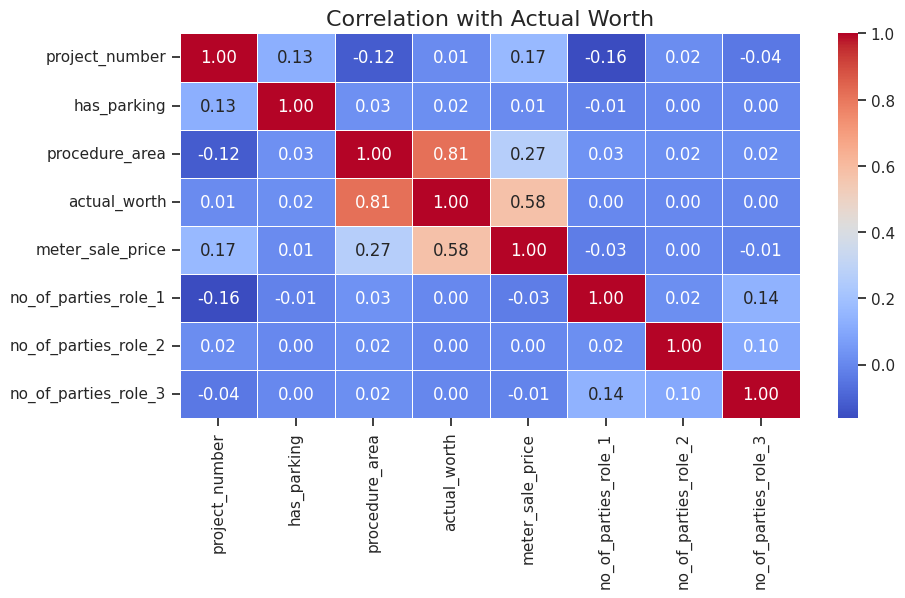

In [ ]:
# Создание матрицы корреляции
numerical_features = df.drop(columns=['year','month','day']).select_dtypes(include=['float64', 'int64'])

# Создание матрицы корреляции для числовых признаков
correlation_matrix = numerical_features.corr()

display(correlation_matrix)

# Создание тепловой карты для визуализации корреляций
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation with Actual Worth', fontsize=16)
plt.show()

> Как я и предполагал в блоке 2, обнаружена положительная корреляция между тремя ключевыми переменными: Ценой, Площадью недвижимости и Ценой за квадратный метр. Зависимость между Ценой недвижимости и ее Площадью составляет 81%, что является достаточно высоким показателем, что означает, что фактической стоимости недвижимости склонна увеличиваться по мере увеличения площади объекта. Более слабая зависимость на уровне 58% между Ценой недвижимости и Ценой за квадратный метр объясняется существованием мультиколлинеарности. Это может подтверждаться неявным воздействие дополнительной переменной на Цену недвижимости. С уверенностью могу предположить, что существует линейная зависимость между Ценой за квадратный метр, Районом продажи недвижимости и Инфраструктурой в этом районе. Также видно, что наличие парковки и количество участников в различных ролях транзакций не являются существенными факторами, влияющими на фактическую стоимость недвижимости, в силу низкой или отсутствующей корреляции с фактической стоимости недвижимости

* Гипотезы:
    * Большая площадь недвижимости является существенным фактором, влияющим на цену объекта в Дубае.
    * Цена за квадратный метр является одним из важных предикторов общей стоимости объекта на рынке недвижимости Дубая.
    * Дополнительные удобства и количество участников сделки имеют ограниченное/не имеют влияние на стоимость недвижимости в данном регионе.



## 9. Price Prediction


> Я буду использовать ансамблиемый метод машинного обучения - Boosting, а именно open-source framework CatBoost/XGBoost. Это метод, который используем деревья решений как weak models при обучении и прогнозировании целевой переменной. Так как это алгоритм бустинга на "деревьях", то здесь опционально - это масштабирование/стандартизация, выбор необходимых регрессоров для модели или  кодрирование категориальных признаков, если только не используете сторонние фреймворки, которые поддерживают такие алгоритмы. Поскольку я планирую использовать CatBoost как baseline для моей задачи, то кодирование категориальных признаков можно не делать, так как там есть встроенный предпроцессор, который делает это за вас достаточно хорошим образом. У нас есть достаточно сильно скоррелированные признаки, которые будут создавать проблему мультиколлинеарности, однако, бустинговые алгоритмы, в некоторой степени устойчив к мультиколлинеарности. Это происходит потому, что деревья решений, используемые в бустинге, способны автоматически выбирать наиболее информативные признаки для разделения, игнорируя менее значимые. Чтобы помочь алгоритму бороться с этой проблемой, то к baseline CatBoost модели я добавлю гиперпараметры l2_leaf_reg и bagging_temperature, чтобы разрядить данные и сделать регуляризацию.


In [ ]:
df.drop(columns = ['month_name'],axis = 1, inplace = True)
df.head()

,procedure_name_en,instance_date,property_sub_type_en,property_usage_en,reg_type_en,area_name_en,building_name_en,project_number,project_name_en,master_project_en,nearest_landmark_en,nearest_metro_en,nearest_mall_en,rooms_en,has_parking,procedure_area,actual_worth,meter_sale_price,no_of_parties_role_1,no_of_parties_role_2,no_of_parties_role_3,year,month,day
0,Sell - Pre registration,2023-01-30,Flat,Residential,Off-Plan Properties,Al Thanyah Fifth,Seven City JLT,2065.0,SEVEN CITY JLT,Jumeirah Islands,Burj Al Arab,Damac Properties,Marina Mall,Studio,1,35.67,557417.0,15627.05,1.0,1.0,0.0,2023,1,30
2,Sell,2023-05-16,Office,Commercial,Existing Properties,Business Bay,Churchill Tower 1-Commercial,1178.0,CHURCHILL TOWER,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Office,1,57.60,735000.0,12760.42,1.0,1.0,0.0,2023,5,16
8,Sell - Pre registration,2023-05-15,Flat,Residential,Off-Plan Properties,Al Barsha South Fourth,Westwood Grande by Imtiaz,2520.0,Westwood Grande by Imtiaz,Jumeirah Village Circle,Sports City Swimming Academy,Nakheel Metro Station,Marina Mall,1 B/R,1,76.58,819152.0,10696.68,1.0,1.0,0.0,2023,5,15
9,Sell - Pre registration,2023-02-09,Flat,Residential,Off-Plan Properties,Business Bay,Peninsula Four,2461.0,Peninsula Four,Business Bay,Downtown Dubai,Business Bay Metro Station,Dubai Mall,Studio,1,49.01,1399000.0,28545.19,1.0,1.0,0.0,2023,2,9
10,Delayed Sell,2023-03-29,Flat,Residential,Existing Properties,Al Khairan First,Creek Gate Tower 2,1813.0,Creek Gate,The Lagoons,Dubai International Airport,Creek Metro Station,City Centre Mirdif,2 B/R,1,192.59,2750000.0,14279.04,1.0,1.0,0.0,2023,3,29


In [ ]:
# Необходимо передать в модель названия признаков, которые являются категориальными, чтобы алгоритм обработал их
categorical_features = df.select_dtypes(include=['object']).columns.tolist()
print(categorical_features)

['procedure_name_en', 'property_sub_type_en', 'property_usage_en', 'reg_type_en', 'area_name_en', 'building_name_en', 'project_name_en', 'master_project_en', 'nearest_landmark_en', 'nearest_metro_en', 'nearest_mall_en', 'rooms_en']


0:	learn: 1102604.7651356	test: 1119663.8864158	best: 1119663.8864158 (0)	total: 201ms	remaining: 5m
100:	learn: 210867.1991208	test: 222819.0551167	best: 222819.0551167 (100)	total: 15.8s	remaining: 3m 38s
200:	learn: 95094.9427756	test: 123523.2016696	best: 123523.2016696 (200)	total: 32.5s	remaining: 3m 30s
300:	learn: 72023.7472890	test: 101628.3644918	best: 101628.3644918 (300)	total: 48.4s	remaining: 3m 12s
400:	learn: 61118.3356177	test: 92869.8317208	best: 92869.8317208 (400)	total: 1m 18s	remaining: 3m 36s
500:	learn: 53226.5051300	test: 87011.1457063	best: 87011.1457063 (500)	total: 1m 39s	remaining: 3m 17s
600:	learn: 48366.0811083	test: 84082.0502658	best: 84082.0502658 (600)	total: 1m 58s	remaining: 2m 57s
700:	learn: 44583.2897819	test: 82008.0956215	best: 82008.0956215 (700)	total: 2m 15s	remaining: 2m 33s
800:	learn: 40160.6062235	test: 80212.7711954	best: 80212.7711954 (800)	total: 2m 31s	remaining: 2m 12s
900:	learn: 37539.8738978	test: 78995.6868284	best: 78995.68682

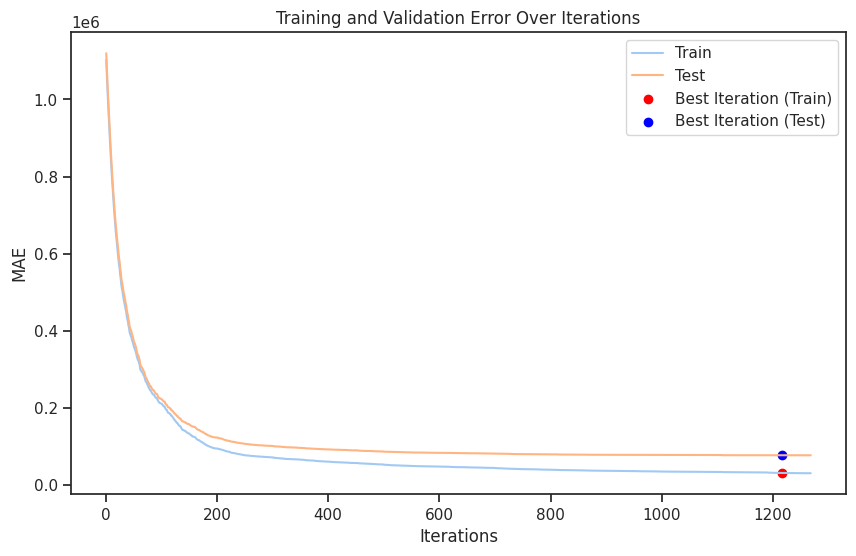

In [ ]:
# Сделаем инициализацию модели и создадим переменные для обучения модели
#зададим параметры для модели
params = {'iterations':1500,
          'depth' : 10,
          'learning_rate':0.05,
          'bagging_temperature':0.8,
          'loss_function':'MAE',
          'cat_features':categorical_features}


# Сразу сделаем выбор необходимых признаков для обучения
X = df.drop(columns = ['actual_worth'],axis = 1)
y = df['actual_worth']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

train_pool = Pool(X_train, y_train, cat_features=categorical_features)
test_pool = Pool(X_test, y_test, cat_features=categorical_features)

model = CatBoostRegressor(**params) # делаю инициализацию с параметрами выше
model.fit(train_pool, eval_set=test_pool, early_stopping_rounds=50, verbose=100) # параметры для обучения и ранней остановки

# Получение лучших метрик и итераций для отрисовке на графике
iterations = model.get_best_iteration()
train_error = model.get_best_score()['learn']['MAE']
test_error = model.get_best_score()['validation']['MAE']

# Отрисовка на графике процесса обучения модели(отрисовка функции ошибок) тренировочного и тестового набора данных
plt.figure(figsize=(10, 6))
plt.plot(range(1, iterations + 52), model.get_evals_result()['learn']['MAE'], label='Train')
plt.plot(range(1, iterations + 52), model.get_evals_result()['validation']['MAE'], label='Test')
plt.scatter(iterations, train_error, marker='o', color='red', label='Best Iteration (Train)')
plt.scatter(iterations, test_error, marker='o', color='blue', label='Best Iteration (Test)')
plt.xlabel('Iterations')
plt.ylabel('MAE')
plt.title('Training and Validation Error Over Iterations')
plt.legend()
plt.show()

> Видно, что алгоритм ранней остановки сам прекратил обучение модели, поскольку пошел процесс переобучения модели. Таким образом, данный алгоритм позволил нам получить модель, которая объективно подстаривается под данные и делает качественный прогнозы. Теперь эту модель можно применить на тестовом наборе данных и посмотреть на метрики после прогнозирования.

In [ ]:
# Получение предсказаний на тестовом наборе
y_pred = model.predict(X_test)

# Вычисление MSLE
msle = mean_squared_log_error(y_test, y_pred)

# Вычисление MAE
mae = mean_absolute_error(y_test, y_pred)

# Вычисление MAPE
mape = mean_absolute_percentage_error(y_test, y_pred)

# Значения метрик/ошибок после прогнозирования
print(f'Mean Squared Log Error (MSlE): {msle}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}')

Mean Squared Log Error (MSlE): 0.008879012614923184
Mean Absolute Error (MAE): 77584.58239072323
Mean Absolute Percentage Error (MAPE): 0.030592348940482593


* Средняя абсолютная процентная ошибка (MAPE) составляет всего 3.06%.
* Ошибка предсказания в абсолютной величине (MAE) составляет примерно 77,584 денежных единиц, в которых измеряется цена недвижимости.
* Квадратичная логарифмическая ошибка (MSLE) на уровне 0.00888.

> Достаточно низкие показатели ошибок, которые совершила моя модель свидетельствуют о высокой точности прогнозов и надежности модели при прогнозировании стоимости объектов на рынке недвижимости в Дубае.